In [0]:
%pip install openpyxl
import pandas as pd

# Ruta del archivo subido
ruta_excel = "/Volumes/workspace/datos_runt/runt/VEHÍCULOS_ELÉCTRICOS_E_HÍBRIDOS_MATRICULADOS_EN_COLOMBIA_-_RUNT_2.0_20260907.xlsx"

# Leer el Excel
df_pandas = pd.read_excel(ruta_excel, sheet_name="VEHÍCULOS_ELÉCTRICOS_E_HÍBRIDOS")

# Convertir a Spark DataFrame
df_spark = spark.createDataFrame(df_pandas)

display(df_spark)

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


COMBUSTIBLE,MODELO,AÃ‘O_REGISTRO,CLASE,CARROCERIA,MUNICIPIO,DEPARTAMENTO,CANTIDAD
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,ENVIGADO,Antioquia,14
ELECTRICO,2012.0,2015.0,AUTOMOVIL,BUGGY,ENVIGADO,Antioquia,2
ELECTRICO,2015.0,2015.0,AUTOMOVIL,COUPE,ENVIGADO,Antioquia,2
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,MEDELLIN,Antioquia,18
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,LA CEJA,Antioquia,1
ELECTRICO,2012.0,2015.0,AUTOMOVIL,BUGGY,SAN JERONIMO,Antioquia,1
ELECTRICO,2015.0,2015.0,AUTOMOVIL,HATCH BACK,ENVIGADO,Antioquia,1
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,SABANETA,Antioquia,2
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,BARRANQUILLA,Atlantico,1
GASO ELEC,2015.0,2015.0,AUTOMOVIL,SEDAN,BOGOTA,Bogota D.C.,1


In [0]:
ruta_parquet = "/Volumes/workspace/datos_runt/runt/vehiculos_electricos_parquet"
df_spark.write.mode("overwrite").parquet(ruta_parquet)

In [0]:
df_verificado = spark.read.parquet(ruta_parquet)
display(df_verificado)

COMBUSTIBLE,MODELO,AÃ‘O_REGISTRO,CLASE,CARROCERIA,MUNICIPIO,DEPARTAMENTO,CANTIDAD
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,ENVIGADO,Antioquia,14
ELECTRICO,2012.0,2015.0,AUTOMOVIL,BUGGY,ENVIGADO,Antioquia,2
ELECTRICO,2015.0,2015.0,AUTOMOVIL,COUPE,ENVIGADO,Antioquia,2
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,MEDELLIN,Antioquia,18
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,LA CEJA,Antioquia,1
ELECTRICO,2012.0,2015.0,AUTOMOVIL,BUGGY,SAN JERONIMO,Antioquia,1
ELECTRICO,2015.0,2015.0,AUTOMOVIL,HATCH BACK,ENVIGADO,Antioquia,1
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,SABANETA,Antioquia,2
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,BARRANQUILLA,Atlantico,1
GASO ELEC,2015.0,2015.0,AUTOMOVIL,SEDAN,BOGOTA,Bogota D.C.,1


In [0]:
# ===========================
# CAPA BRONZE - Datos crudos
# ===========================
df_bronze = spark.read.parquet(ruta_parquet)
print("Capa Bronze cargada")
display(df_bronze)

# ===========================
# CAPA SILVER - Datos limpios y transformados
# ===========================

# Corregir el nombre de la columna usando el índice de posición
from pyspark.sql.functions import col

# Obtener los nombres actuales de las columnas
old_columns = df_bronze.columns

# Crear lista de nuevos nombres, cambiando solo la columna en la posición 2 (AÑO_REGISTRO)
new_columns = []
for i, col_name in enumerate(old_columns):
    if i == 2:  # La columna AÑO_REGISTRO está en la posición 2 (índice 2)
        new_columns.append("REGISTRO")
    else:
        new_columns.append(col_name)

# Aplicar los nuevos nombres
df_silver = df_bronze.toDF(*new_columns)

# Corregir el valor "OCAÃ‘A" por "OCANA" en la columna MUNICIPIO
# El string original contiene caracteres especiales: Ã y ‘ (comilla izquierda Unicode)
from pyspark.sql.functions import when
df_silver = df_silver.withColumn(
    "MUNICIPIO",
    when(col("MUNICIPIO") == "OCAÃ‘A", "OCANA").otherwise(col("MUNICIPIO"))
)

print("\nCapa Silver - Datos principales con columna corregida:")
display(df_silver)

# Estadísticas descriptivas de la tabla principal Silver
print("\n📊 ESTADÍSTICAS DESCRIPTIVAS - Tabla Silver Principal:")
print("="*70)

# Estadísticas numéricas
print("\n1. Estadísticas de columnas numéricas:")
df_silver_stats = df_silver.select("MODELO", "REGISTRO", "CANTIDAD").describe()
display(df_silver_stats)

# Conteos por categorías principales
from pyspark.sql.functions import countDistinct, sum as _sum, avg, min as _min, max as _max

print("\n2. Análisis categórico:")
stats_categoricas = df_silver.select(
    countDistinct("COMBUSTIBLE").alias("Tipos_Combustible"),
    countDistinct("CLASE").alias("Tipos_Clase"),
    countDistinct("CARROCERIA").alias("Tipos_Carroceria"),
    countDistinct("MUNICIPIO").alias("Total_Municipios"),
    countDistinct("DEPARTAMENTO").alias("Total_Departamentos")
)
display(stats_categoricas)

print("\n3. Distribución de registros totales:")
dist_total = df_silver.select(
    _sum("CANTIDAD").alias("Total_Vehiculos"),
    avg("CANTIDAD").alias("Promedio_por_Registro"),
    _min("CANTIDAD").alias("Min_Cantidad"),
    _max("CANTIDAD").alias("Max_Cantidad")
)
display(dist_total)

# Guardar tabla silver principal
df_silver.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_silver")

# ===========================
# SILVER - Tabla 1: Tipo de automóvil, Año, Cantidad de vehículos
# ===========================
from pyspark.sql.functions import col, count

df_silver_tipo_anio = df_silver.groupBy("CLASE", "REGISTRO") \
    .agg(count("*").alias("CANTIDAD_VEHICULOS")) \
    .orderBy("CLASE", "REGISTRO")

print("\nSilver - Tabla 1: Tipo de automóvil, Año, Cantidad:")
display(df_silver_tipo_anio)

# Estadísticas descriptivas Tabla 1
print("\n📊 ESTADÍSTICAS DESCRIPTIVAS - Tabla Silver Tipo de Automóvil por Año:")
print("="*70)

print("\n1. Estadísticas generales:")
stats_tipo = df_silver_tipo_anio.select(
    countDistinct("CLASE").alias("Total_Tipos_Vehiculos"),
    countDistinct("REGISTRO").alias("Total_Años"),
    _sum("CANTIDAD_VEHICULOS").alias("Total_Vehiculos"),
    avg("CANTIDAD_VEHICULOS").alias("Promedio_Vehiculos_por_Categoria"),
    _min("CANTIDAD_VEHICULOS").alias("Min_Vehiculos"),
    _max("CANTIDAD_VEHICULOS").alias("Max_Vehiculos")
)
display(stats_tipo)

print("\n2. Top 5 tipos de vehículos más registrados:")
top_tipos = df_silver_tipo_anio.groupBy("CLASE") \
    .agg(_sum("CANTIDAD_VEHICULOS").alias("Total")) \
    .orderBy(col("Total").desc()) \
    .limit(5)
display(top_tipos)

print("\n3. Estadísticas por año:")
stats_por_año = df_silver_tipo_anio.groupBy("REGISTRO") \
    .agg(
        _sum("CANTIDAD_VEHICULOS").alias("Total_Vehiculos"),
        avg("CANTIDAD_VEHICULOS").alias("Promedio_por_Tipo"),
        countDistinct("CLASE").alias("Tipos_Diferentes")
    ) \
    .orderBy("REGISTRO")
display(stats_por_año)

# Guardar tabla
df_silver_tipo_anio.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_silver_tipo_anio")

# ===========================
# SILVER - Tabla 2: Municipio, Año, Cantidad de vehículos
# ===========================
df_silver_municipio_anio = df_silver.groupBy("MUNICIPIO", "REGISTRO") \
    .agg(count("*").alias("CANTIDAD_VEHICULOS")) \
    .orderBy("MUNICIPIO", "REGISTRO")

print("\nSilver - Tabla 2: Municipio, Año, Cantidad:")
display(df_silver_municipio_anio)

# Estadísticas descriptivas Tabla 2
print("\n📊 ESTADÍSTICAS DESCRIPTIVAS - Tabla Silver Municipio por Año:")
print("="*70)

print("\n1. Estadísticas generales:")
stats_municipio = df_silver_municipio_anio.select(
    countDistinct("MUNICIPIO").alias("Total_Municipios"),
    countDistinct("REGISTRO").alias("Total_Años"),
    _sum("CANTIDAD_VEHICULOS").alias("Total_Vehiculos"),
    avg("CANTIDAD_VEHICULOS").alias("Promedio_Vehiculos_por_Municipio"),
    _min("CANTIDAD_VEHICULOS").alias("Min_Vehiculos"),
    _max("CANTIDAD_VEHICULOS").alias("Max_Vehiculos")
)
display(stats_municipio)

print("\n2. Top 10 municipios con más registros:")
top_municipios = df_silver_municipio_anio.groupBy("MUNICIPIO") \
    .agg(_sum("CANTIDAD_VEHICULOS").alias("Total")) \
    .orderBy(col("Total").desc()) \
    .limit(10)
display(top_municipios)

print("\n3. Crecimiento por año (total de vehículos registrados):")
crecimiento_anual = df_silver_municipio_anio.groupBy("REGISTRO") \
    .agg(
        _sum("CANTIDAD_VEHICULOS").alias("Total_Vehiculos"),
        countDistinct("MUNICIPIO").alias("Municipios_Activos")
    ) \
    .orderBy("REGISTRO")
display(crecimiento_anual)

# Guardar tabla
df_silver_municipio_anio.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_silver_municipio_anio")

# ===========================
# CAPA GOLD - Train/Test con Time Series
# ===========================
from pyspark.sql.functions import col

# Tabla Gold 1: Train/Test de Tipo de automóvil por año
df_gold_tipo = df_silver_tipo_anio.orderBy("REGISTRO")

# Obtener el año máximo para hacer el split temporal
max_year = df_gold_tipo.agg({"REGISTRO": "max"}).collect()[0][0]

# Split: 80% train (años anteriores), 20% test (años más recientes)
df_gold_tipo_train = df_gold_tipo.filter(col("REGISTRO") < max_year)
df_gold_tipo_test = df_gold_tipo.filter(col("REGISTRO") >= max_year)

print("\nGold - Tabla 1 TRAIN: Tipo de automóvil (Time Series):")
display(df_gold_tipo_train)

print("\nGold - Tabla 1 TEST: Tipo de automóvil (Time Series):")
display(df_gold_tipo_test)

# Guardar tablas
df_gold_tipo_train.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_gold_tipo_train")
df_gold_tipo_test.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_gold_tipo_test")

# Tabla Gold 2: Train/Test de Municipio por año
df_gold_municipio = df_silver_municipio_anio.orderBy("REGISTRO")

# Split temporal: 80% train, 20% test
df_gold_municipio_train = df_gold_municipio.filter(col("REGISTRO") < max_year)
df_gold_municipio_test = df_gold_municipio.filter(col("REGISTRO") >= max_year)

print("\nGold - Tabla 2 TRAIN: Municipio (Time Series):")
display(df_gold_municipio_train)

print("\nGold - Tabla 2 TEST: Municipio (Time Series):")
display(df_gold_municipio_test)

# Guardar tablas
df_gold_municipio_train.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_gold_municipio_train")
df_gold_municipio_test.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_gold_municipio_test")

print("\n✅ Arquitectura Medallion completada:")
print("   - Bronze: Datos crudos")
print("   - Silver: 3 tablas (principal + tipo_año + municipio_año)")
print("   - Gold: 4 tablas (train/test para tipo y municipio)")

Capa Bronze cargada


COMBUSTIBLE,MODELO,AÃ‘O_REGISTRO,CLASE,CARROCERIA,MUNICIPIO,DEPARTAMENTO,CANTIDAD
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,ENVIGADO,Antioquia,14
ELECTRICO,2012.0,2015.0,AUTOMOVIL,BUGGY,ENVIGADO,Antioquia,2
ELECTRICO,2015.0,2015.0,AUTOMOVIL,COUPE,ENVIGADO,Antioquia,2
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,MEDELLIN,Antioquia,18
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,LA CEJA,Antioquia,1
ELECTRICO,2012.0,2015.0,AUTOMOVIL,BUGGY,SAN JERONIMO,Antioquia,1
ELECTRICO,2015.0,2015.0,AUTOMOVIL,HATCH BACK,ENVIGADO,Antioquia,1
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,SABANETA,Antioquia,2
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,BARRANQUILLA,Atlantico,1
GASO ELEC,2015.0,2015.0,AUTOMOVIL,SEDAN,BOGOTA,Bogota D.C.,1



Capa Silver - Datos principales con columna corregida:


COMBUSTIBLE,MODELO,REGISTRO,CLASE,CARROCERIA,MUNICIPIO,DEPARTAMENTO,CANTIDAD
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,ENVIGADO,Antioquia,14
ELECTRICO,2012.0,2015.0,AUTOMOVIL,BUGGY,ENVIGADO,Antioquia,2
ELECTRICO,2015.0,2015.0,AUTOMOVIL,COUPE,ENVIGADO,Antioquia,2
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,MEDELLIN,Antioquia,18
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,LA CEJA,Antioquia,1
ELECTRICO,2012.0,2015.0,AUTOMOVIL,BUGGY,SAN JERONIMO,Antioquia,1
ELECTRICO,2015.0,2015.0,AUTOMOVIL,HATCH BACK,ENVIGADO,Antioquia,1
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,SABANETA,Antioquia,2
ELECTRICO,2016.0,2015.0,AUTOMOVIL,COUPE,BARRANQUILLA,Atlantico,1
GASO ELEC,2015.0,2015.0,AUTOMOVIL,SEDAN,BOGOTA,Bogota D.C.,1



📊 ESTADÍSTICAS DESCRIPTIVAS - Tabla Silver Principal:

1. Estadísticas de columnas numéricas:


summary,MODELO,REGISTRO,CANTIDAD
count,10748,10748,10749
mean,2022.997022701898,2023.039170078154,61.94083170527491
stddev,2.814475349364469,2.5481044099915566,3223.672518964119
min,1997.0,2015.0,1
max,2027.0,2026.0,332901



2. Análisis categórico:


Tipos_Combustible,Tipos_Clase,Tipos_Carroceria,Total_Municipios,Total_Departamentos
4,16,51,262,32



3. Distribución de registros totales:


Total_Vehiculos,Promedio_por_Registro,Min_Cantidad,Max_Cantidad
665802,61.94083170527491,1,332901



Silver - Tabla 1: Tipo de automóvil, Año, Cantidad:


CLASE,REGISTRO,CANTIDAD_VEHICULOS
null,null,1
AUTOMOVIL,2015.0,29
AUTOMOVIL,2016.0,30
AUTOMOVIL,2017.0,28
AUTOMOVIL,2018.0,50
AUTOMOVIL,2019.0,121
AUTOMOVIL,2020.0,152
AUTOMOVIL,2021.0,230
AUTOMOVIL,2022.0,275
AUTOMOVIL,2023.0,330



📊 ESTADÍSTICAS DESCRIPTIVAS - Tabla Silver Tipo de Automóvil por Año:

1. Estadísticas generales:


Total_Tipos_Vehiculos,Total_Años,Total_Vehiculos,Promedio_Vehiculos_por_Categoria,Min_Vehiculos,Max_Vehiculos
16,12,10749,82.68461538461538,1,879



2. Top 5 tipos de vehículos más registrados:


CLASE,Total
CAMIONETA,3877
AUTOMOVIL,2717
CICLOMOTOR,1863
CAMPERO,840
MOTOCICLETA,396



3. Estadísticas por año:


REGISTRO,Total_Vehiculos,Promedio_por_Tipo,Tipos_Diferentes
null,1,1.0,0
2015.0,107,10.7,10
2016.0,92,15.333333333333334,6
2017.0,122,15.25,8
2018.0,297,33.0,9
2019.0,551,50.09090909090909,11
2020.0,645,58.63636363636363,11
2021.0,1002,83.5,12
2022.0,1112,111.2,10
2023.0,1287,99.0,13



Silver - Tabla 2: Municipio, Año, Cantidad:


MUNICIPIO,REGISTRO,CANTIDAD_VEHICULOS
null,null,1
ACACIAS,2017.0,1
ACACIAS,2018.0,2
ACACIAS,2019.0,3
ACACIAS,2020.0,2
ACACIAS,2021.0,3
ACACIAS,2022.0,6
ACACIAS,2023.0,5
ACACIAS,2024.0,9
ACACIAS,2025.0,15



📊 ESTADÍSTICAS DESCRIPTIVAS - Tabla Silver Municipio por Año:

1. Estadísticas generales:


Total_Municipios,Total_Años,Total_Vehiculos,Promedio_Vehiculos_por_Municipio,Min_Vehiculos,Max_Vehiculos
262,12,10749,6.518496058217101,1,112



2. Top 10 municipios con más registros:


MUNICIPIO,Total
BOGOTA,625
ENVIGADO,399
FUNZA,370
MEDELLIN,330
CALI,299
SABANETA,295
CHIA,244
MOSQUERA,222
VILLA DEL ROSARIO,208
PEREIRA,193



3. Crecimiento por año (total de vehículos registrados):


REGISTRO,Total_Vehiculos,Municipios_Activos
null,1,0
2015.0,107,46
2016.0,92,48
2017.0,122,43
2018.0,297,91
2019.0,551,143
2020.0,645,154
2021.0,1002,158
2022.0,1112,171
2023.0,1287,181



Gold - Tabla 1 TRAIN: Tipo de automóvil (Time Series):


CLASE,REGISTRO,CANTIDAD_VEHICULOS
CAMPERO,2015.0,1
CUADRICICLO,2015.0,2
CUATRIMOTO,2015.0,1
MOTOCICLETA,2015.0,53
VOLQUETA,2015.0,2
CAMION,2015.0,4
CAMIONETA,2015.0,10
BUS,2015.0,4
TRACTOCAMION,2015.0,1
AUTOMOVIL,2015.0,29



Gold - Tabla 1 TEST: Tipo de automóvil (Time Series):


CLASE,REGISTRO,CANTIDAD_VEHICULOS
CUADRICICLO,2026.0,40
MICROBUS,2026.0,2
MOTOCICLETA,2026.0,54
MOTOTRICICLO,2026.0,4
CUATRIMOTO,2026.0,1
CICLOMOTOR,2026.0,110
MOTOCARRO,2026.0,42
CAMION,2026.0,16
CAMPERO,2026.0,226
CAMIONETA,2026.0,818



Gold - Tabla 2 TRAIN: Municipio (Time Series):


MUNICIPIO,REGISTRO,CANTIDAD_VEHICULOS
PASTO,2015.0,1
RIVERA,2015.0,1
BARRANQUILLA,2015.0,1
FUNZA,2015.0,7
BOGOTA,2015.0,24
SANTA MARTA,2015.0,3
FLORENCIA,2015.0,2
GUADALAJARA DE BUGA,2015.0,2
FLORIDA,2015.0,1
MEDELLIN,2015.0,2



Gold - Tabla 2 TEST: Municipio (Time Series):


MUNICIPIO,REGISTRO,CANTIDAD_VEHICULOS
ENVIGADO,2026.0,52
COPACABANA,2026.0,4
MOMPOS,2026.0,1
RIOHACHA,2026.0,4
IPIALES,2026.0,4
LA UNION,2026.0,4
SAN GIL,2026.0,5
LEBRIJA,2026.0,4
SEVILLA,2026.0,6
ALCALA,2026.0,6



✅ Arquitectura Medallion completada:
   - Bronze: Datos crudos
   - Silver: 3 tablas (principal + tipo_año + municipio_año)
   - Gold: 4 tablas (train/test para tipo y municipio)


In [0]:
# ===========================
# CAPA GOLD - Reclasificación por Categorías de Negocio
# ===========================

from pyspark.sql.functions import col, when, sum as _sum, count

print("\n" + "="*70)
print("📊 GOLD - RECLASIFICACIÓN POR CATEGORÍAS DE NEGOCIO")
print("="*70)

# Crear una nueva columna de categoría de negocio basada en CLASE
df_silver_with_category = df_silver.withColumn(
    "CATEGORIA_NEGOCIO",
    when(col("CLASE").isin(["AUTOMOVIL"]), "Vehículos Personales")
    .when(col("CLASE").isin(["CAMPERO", "CAMIONETA"]), "Vehículos Utilitarios")
    .when(col("CLASE").isin(["CAMION", "TRACTOCAMION"]), "Transporte de Carga")
    .when(col("CLASE").isin(["BUS", "BUSETA", "MICROBUS"]), "Transporte Público")
    .when(col("CLASE").isin(["MOTOCICLETA", "CUATRIMOTO", "TRICIMOTO", "MOTOTRICICLO", "MOTOCARRO"]), "Motocicletas y Similares")
    .when(col("CLASE").isin(["VOLQUETA", "MEZCLADOR"]), "Construcción e Industria")
    .otherwise("Otros Vehículos Especiales")
)

print("\n1️⃣ Vista previa de datos con categoría de negocio:")
display(df_silver_with_category.select("CLASE", "CATEGORIA_NEGOCIO", "COMBUSTIBLE", "REGISTRO", "CANTIDAD").limit(20))

# ===========================
# GOLD - Tabla de resumen por categoría de negocio y año
# ===========================
df_gold_business_category = df_silver_with_category.groupBy("CATEGORIA_NEGOCIO", "REGISTRO") \
    .agg(
        _sum("CANTIDAD").alias("TOTAL_VEHICULOS"),
        count("*").alias("NUMERO_REGISTROS")
    ) \
    .orderBy("CATEGORIA_NEGOCIO", "REGISTRO")

print("\n2️⃣ Gold - Resumen por Categoría de Negocio y Año:")
display(df_gold_business_category)

# Estadísticas por categoría de negocio
print("\n3️⃣ Estadísticas totales por categoría de negocio:")
df_gold_business_total = df_gold_business_category.groupBy("CATEGORIA_NEGOCIO") \
    .agg(
        _sum("TOTAL_VEHICULOS").alias("TOTAL_HISTORICO"),
        _sum("NUMERO_REGISTROS").alias("TOTAL_REGISTROS")
    ) \
    .orderBy(col("TOTAL_HISTORICO").desc())

display(df_gold_business_total)

# ===========================
# GOLD - Train/Test por categoría de negocio
# ===========================
print("\n4️⃣ Gold - Train/Test por Categoría de Negocio (Time Series):")

# Obtener el año máximo para el split temporal
max_year = df_gold_business_category.agg({"REGISTRO": "max"}).collect()[0][0]

# Split: 80% train (años anteriores), 20% test (años más recientes)
df_gold_business_train = df_gold_business_category.filter(col("REGISTRO") < max_year)
df_gold_business_test = df_gold_business_category.filter(col("REGISTRO") >= max_year)

print(f"\nAño de corte para Train/Test: {max_year}")
print(f"Train: años < {max_year}")
print(f"Test: años >= {max_year}")

print("\nGold - TRAIN: Categoría de Negocio")
display(df_gold_business_train)

print("\nGold - TEST: Categoría de Negocio")
display(df_gold_business_test)

# Guardar tablas Gold de categoría de negocio
df_gold_business_category.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_gold_business_category")
df_gold_business_train.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_gold_business_train")
df_gold_business_test.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("vehiculos_gold_business_test")

print("\n" + "="*70)
print("✅ Reclasificación Gold por Categorías de Negocio completada")
print("   - vehiculos_gold_business_category (resumen completo)")
print("   - vehiculos_gold_business_train (conjunto de entrenamiento)")
print("   - vehiculos_gold_business_test (conjunto de prueba)")
print("="*70)


📊 GOLD - RECLASIFICACIÓN POR CATEGORÍAS DE NEGOCIO

1️⃣ Vista previa de datos con categoría de negocio:


CLASE,CATEGORIA_NEGOCIO,COMBUSTIBLE,REGISTRO,CANTIDAD
AUTOMOVIL,Vehículos Personales,ELECTRICO,2015.0,14
AUTOMOVIL,Vehículos Personales,ELECTRICO,2015.0,2
AUTOMOVIL,Vehículos Personales,ELECTRICO,2015.0,2
AUTOMOVIL,Vehículos Personales,ELECTRICO,2015.0,18
AUTOMOVIL,Vehículos Personales,ELECTRICO,2015.0,1
AUTOMOVIL,Vehículos Personales,ELECTRICO,2015.0,1
AUTOMOVIL,Vehículos Personales,ELECTRICO,2015.0,1
AUTOMOVIL,Vehículos Personales,ELECTRICO,2015.0,2
AUTOMOVIL,Vehículos Personales,ELECTRICO,2015.0,1
AUTOMOVIL,Vehículos Personales,GASO ELEC,2015.0,1



2️⃣ Gold - Resumen por Categoría de Negocio y Año:


CATEGORIA_NEGOCIO,REGISTRO,TOTAL_VEHICULOS,NUMERO_REGISTROS
Construcción e Industria,2015.0,2,2
Motocicletas y Similares,2015.0,306,54
Motocicletas y Similares,2016.0,223,45
Motocicletas y Similares,2017.0,97,29
Motocicletas y Similares,2018.0,46,20
Motocicletas y Similares,2019.0,52,27
Motocicletas y Similares,2020.0,96,35
Motocicletas y Similares,2021.0,206,51
Motocicletas y Similares,2022.0,124,60
Motocicletas y Similares,2023.0,322,86



3️⃣ Estadísticas totales por categoría de negocio:


CATEGORIA_NEGOCIO,TOTAL_HISTORICO,TOTAL_REGISTROS
Otros Vehículos Especiales,350125,2155
Vehículos Utilitarios,244041,4717
Vehículos Personales,65686,2717
Motocicletas y Similares,3203,903
Transporte Público,1937,57
Transporte de Carga,808,198
Construcción e Industria,2,2



4️⃣ Gold - Train/Test por Categoría de Negocio (Time Series):

Año de corte para Train/Test: 2026.0
Train: años < 2026.0
Test: años >= 2026.0

Gold - TRAIN: Categoría de Negocio


CATEGORIA_NEGOCIO,REGISTRO,TOTAL_VEHICULOS,NUMERO_REGISTROS
Construcción e Industria,2015.0,2,2
Motocicletas y Similares,2015.0,306,54
Motocicletas y Similares,2016.0,223,45
Motocicletas y Similares,2017.0,97,29
Motocicletas y Similares,2018.0,46,20
Motocicletas y Similares,2019.0,52,27
Motocicletas y Similares,2020.0,96,35
Motocicletas y Similares,2021.0,206,51
Motocicletas y Similares,2022.0,124,60
Motocicletas y Similares,2023.0,322,86



Gold - TEST: Categoría de Negocio


CATEGORIA_NEGOCIO,REGISTRO,TOTAL_VEHICULOS,NUMERO_REGISTROS
Motocicletas y Similares,2026.0,410,140
Otros Vehículos Especiales,2026.0,341,150
Transporte Público,2026.0,163,10
Transporte de Carga,2026.0,54,16
Vehículos Personales,2026.0,14442,524
Vehículos Utilitarios,2026.0,72551,1044



✅ Reclasificación Gold por Categorías de Negocio completada
   - vehiculos_gold_business_category (resumen completo)
   - vehiculos_gold_business_train (conjunto de entrenamiento)
   - vehiculos_gold_business_test (conjunto de prueba)



📊 ANÁLISIS ESTADÍSTICO AVANZADO

1️⃣ VARIANZAS DE COLUMNAS NUMÉRICAS:
----------------------------------------------------------------------


Varianza_Modelo,Varianza_Registro,Varianza_Cantidad,Desv_Std_Modelo,Desv_Std_Registro,Desv_Std_Cantidad
7.921271492180251,6.4928360842184185,1.0392064509524466E7,2.814475349364469,2.5481044099915566,3223.672518964119



2️⃣ MATRIZ DE CORRELACIÓN:
----------------------------------------------------------------------

Correlación entre MODELO y REGISTRO:
  r = 0.9982

Correlación entre MODELO y CANTIDAD:
  r = -0.9850

Correlación entre REGISTRO y CANTIDAD:
  r = -0.9871

Matriz de Correlación Completa:


MODELO,REGISTRO,CANTIDAD
1.0,0.9981801802189456,-0.9849987406302579
0.9981801802189456,1.0,-0.9870649217690236
-0.9849987406302579,-0.9870649217690236,1.0



3️⃣ VISUALIZACIONES:
----------------------------------------------------------------------

📈 Gráfico 1: Evolución Temporal de los 5 Tipos de Vehículos Más Registrados


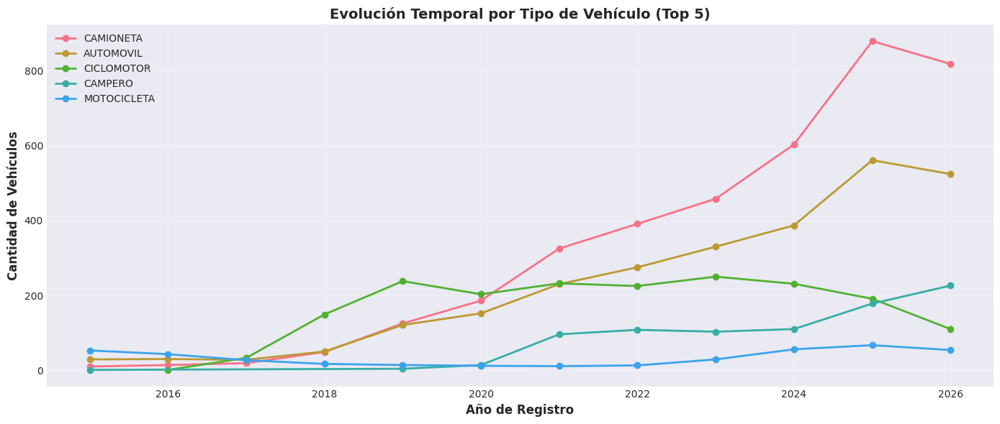


📊 Gráfico 2: Distribución Total por Tipo de Vehículo


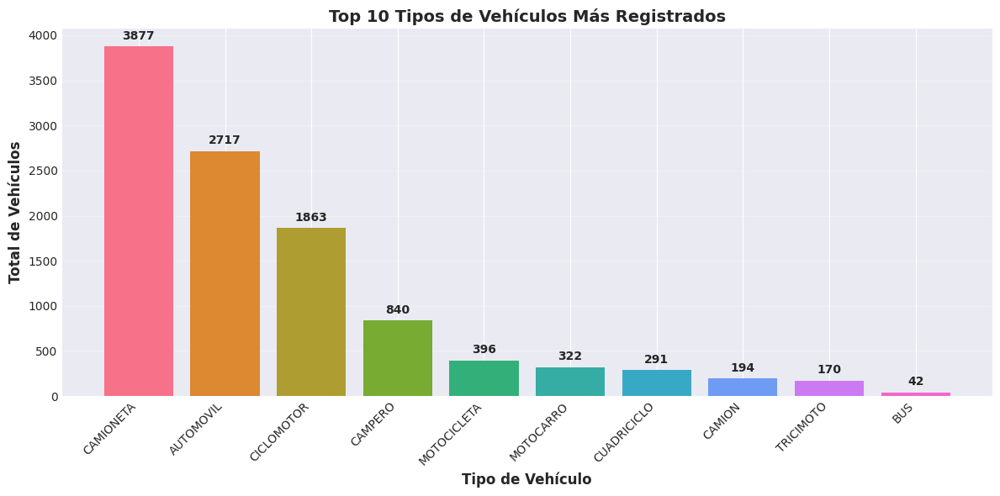


📈 Gráfico 3: Crecimiento Anual Total de Vehículos Eléctricos e Híbridos


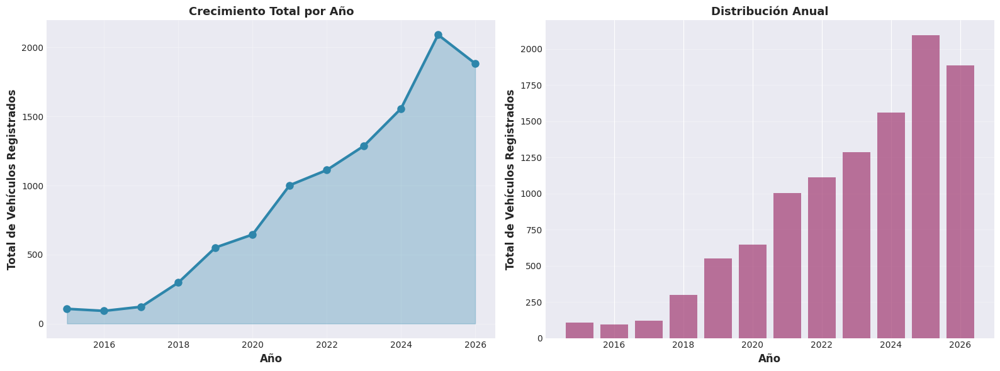


🏙️ Gráfico 4: Top 15 Municipios con Más Vehículos Registrados


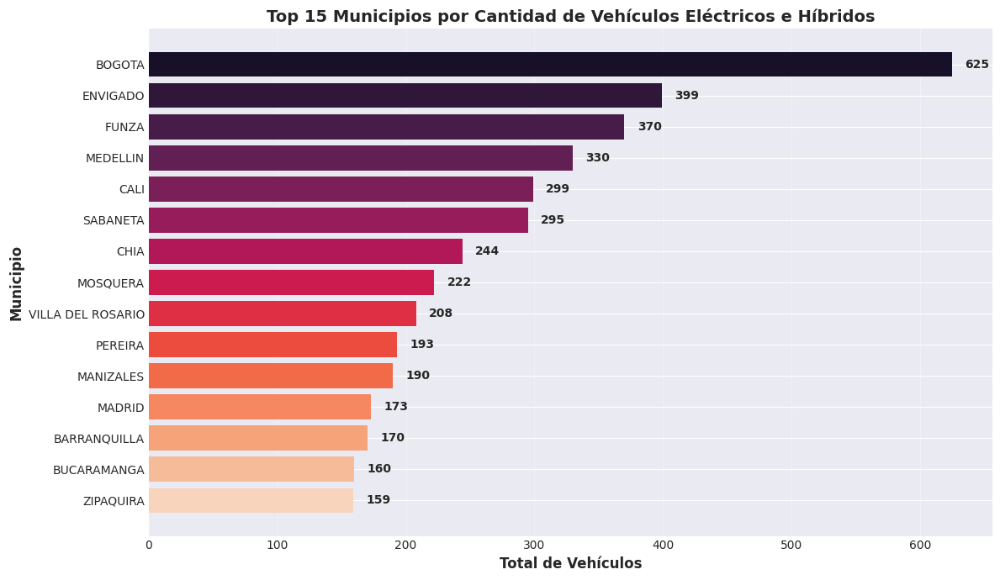


🔥 Gráfico 5: Mapa de Calor - Matriz de Correlación


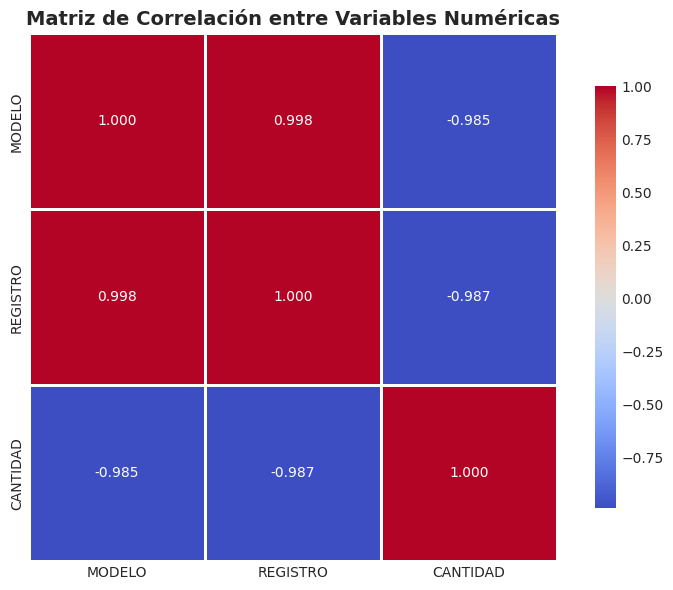


📦 Gráfico 6: Distribución de Cantidad por Tipo de Vehículo (Box Plot)


/home/spark-123991b2-a1f8-44be-a6d2-26/.ipykernel/75/command-8512389179714745-2011581341:175: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_top5_box, x='CLASE', y='CANTIDAD_VEHICULOS', ax=ax, palette='Set2')


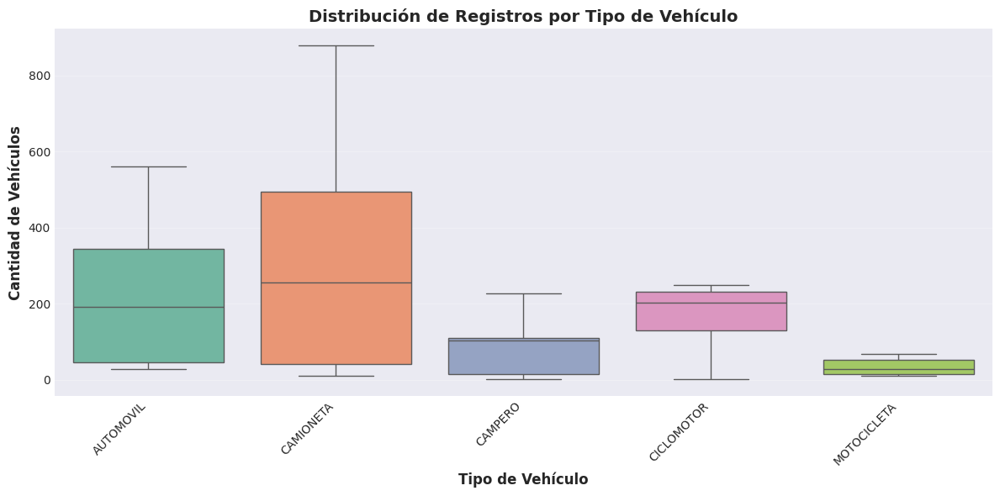


✅ Análisis estadístico y visualizaciones completadas


In [0]:
# ===========================
# ANÁLISIS ESTADÍSTICO AVANZADO Y VISUALIZACIONES
# ===========================

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pyspark.sql.functions import variance, stddev, corr

# Configurar estilo de gráficos
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("\n" + "="*70)
print("📊 ANÁLISIS ESTADÍSTICO AVANZADO")
print("="*70)

# ===========================
# 1. CÁLCULO DE VARIANZAS
# ===========================
print("\n1️⃣ VARIANZAS DE COLUMNAS NUMÉRICAS:")
print("-" * 70)

varianzas = df_silver.select(
    variance("MODELO").alias("Varianza_Modelo"),
    variance("REGISTRO").alias("Varianza_Registro"),
    variance("CANTIDAD").alias("Varianza_Cantidad"),
    stddev("MODELO").alias("Desv_Std_Modelo"),
    stddev("REGISTRO").alias("Desv_Std_Registro"),
    stddev("CANTIDAD").alias("Desv_Std_Cantidad")
)

display(varianzas)

# ===========================
# 2. MATRIZ DE CORRELACIÓN
# ===========================
print("\n2️⃣ MATRIZ DE CORRELACIÓN:")
print("-" * 70)

# Calcular correlaciones entre variables numéricas
print("\nCorrelación entre MODELO y REGISTRO:")
corr_modelo_registro = df_silver.stat.corr("MODELO", "REGISTRO")
print(f"  r = {corr_modelo_registro:.4f}")

print("\nCorrelación entre MODELO y CANTIDAD:")
corr_modelo_cantidad = df_silver.stat.corr("MODELO", "CANTIDAD")
print(f"  r = {corr_modelo_cantidad:.4f}")

print("\nCorrelación entre REGISTRO y CANTIDAD:")
corr_registro_cantidad = df_silver.stat.corr("REGISTRO", "CANTIDAD")
print(f"  r = {corr_registro_cantidad:.4f}")

# Crear matriz de correlación visual
corr_data = pd.DataFrame([
    [1.0, corr_modelo_registro, corr_modelo_cantidad],
    [corr_modelo_registro, 1.0, corr_registro_cantidad],
    [corr_modelo_cantidad, corr_registro_cantidad, 1.0]
], columns=['MODELO', 'REGISTRO', 'CANTIDAD'], index=['MODELO', 'REGISTRO', 'CANTIDAD'])

print("\nMatriz de Correlación Completa:")
display(corr_data)

# ===========================
# 3. VISUALIZACIONES
# ===========================
print("\n3️⃣ VISUALIZACIONES:")
print("-" * 70)

# Convertir datos necesarios a pandas para graficar
df_tipo_anio_pd = df_silver_tipo_anio.toPandas()
df_municipio_anio_pd = df_silver_municipio_anio.toPandas()

# Gráfico 1: Evolución temporal por tipo de vehículo (Top 5)
print("\n📈 Gráfico 1: Evolución Temporal de los 5 Tipos de Vehículos Más Registrados")
top5_tipos = df_tipo_anio_pd.groupby('CLASE')['CANTIDAD_VEHICULOS'].sum().nlargest(5).index
df_top5 = df_tipo_anio_pd[df_tipo_anio_pd['CLASE'].isin(top5_tipos)]

fig, ax = plt.subplots(figsize=(14, 6))
for tipo in top5_tipos:
    data = df_top5[df_top5['CLASE'] == tipo].sort_values('REGISTRO')
    ax.plot(data['REGISTRO'], data['CANTIDAD_VEHICULOS'], marker='o', linewidth=2, label=tipo)

ax.set_xlabel('Año de Registro', fontsize=12, fontweight='bold')
ax.set_ylabel('Cantidad de Vehículos', fontsize=12, fontweight='bold')
ax.set_title('Evolución Temporal por Tipo de Vehículo (Top 5)', fontsize=14, fontweight='bold')
ax.legend(loc='best', fontsize=10)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Gráfico 2: Distribución total por tipo de vehículo
print("\n📊 Gráfico 2: Distribución Total por Tipo de Vehículo")
total_por_tipo = df_tipo_anio_pd.groupby('CLASE')['CANTIDAD_VEHICULOS'].sum().sort_values(ascending=False).head(10)

fig, ax = plt.subplots(figsize=(12, 6))
colors = sns.color_palette('husl', len(total_por_tipo))
ax.bar(range(len(total_por_tipo)), total_por_tipo.values, color=colors)
ax.set_xticks(range(len(total_por_tipo)))
ax.set_xticklabels(total_por_tipo.index, rotation=45, ha='right')
ax.set_xlabel('Tipo de Vehículo', fontsize=12, fontweight='bold')
ax.set_ylabel('Total de Vehículos', fontsize=12, fontweight='bold')
ax.set_title('Top 10 Tipos de Vehículos Más Registrados', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')

# Añadir valores en las barras
for i, v in enumerate(total_por_tipo.values):
    ax.text(i, v + 50, str(int(v)), ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

# Gráfico 3: Crecimiento anual total
print("\n📈 Gráfico 3: Crecimiento Anual Total de Vehículos Eléctricos e Híbridos")
crecimiento = df_tipo_anio_pd.groupby('REGISTRO')['CANTIDAD_VEHICULOS'].sum().sort_index()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Subplot 1: Línea de tiempo
ax1.plot(crecimiento.index, crecimiento.values, marker='o', linewidth=3, markersize=8, color='#2E86AB')
ax1.fill_between(crecimiento.index, crecimiento.values, alpha=0.3, color='#2E86AB')
ax1.set_xlabel('Año', fontsize=12, fontweight='bold')
ax1.set_ylabel('Total de Vehículos Registrados', fontsize=12, fontweight='bold')
ax1.set_title('Crecimiento Total por Año', fontsize=13, fontweight='bold')
ax1.grid(True, alpha=0.3)

# Subplot 2: Barras
ax2.bar(crecimiento.index, crecimiento.values, color='#A23B72', alpha=0.7)
ax2.set_xlabel('Año', fontsize=12, fontweight='bold')
ax2.set_ylabel('Total de Vehículos Registrados', fontsize=12, fontweight='bold')
ax2.set_title('Distribución Anual', fontsize=13, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Gráfico 4: Top 15 municipios
print("\n🏙️ Gráfico 4: Top 15 Municipios con Más Vehículos Registrados")
top_municipios = df_municipio_anio_pd.groupby('MUNICIPIO')['CANTIDAD_VEHICULOS'].sum().sort_values(ascending=False).head(15)

fig, ax = plt.subplots(figsize=(12, 7))
colors = sns.color_palette('rocket', len(top_municipios))
y_pos = range(len(top_municipios))
ax.barh(y_pos, top_municipios.values, color=colors)
ax.set_yticks(y_pos)
ax.set_yticklabels(top_municipios.index)
ax.invert_yaxis()
ax.set_xlabel('Total de Vehículos', fontsize=12, fontweight='bold')
ax.set_ylabel('Municipio', fontsize=12, fontweight='bold')
ax.set_title('Top 15 Municipios por Cantidad de Vehículos Eléctricos e Híbridos', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='x')

# Añadir valores
for i, v in enumerate(top_municipios.values):
    ax.text(v + 10, i, str(int(v)), va='center', fontweight='bold')

plt.tight_layout()
plt.show()

# Gráfico 5: Mapa de calor de correlación
print("\n🔥 Gráfico 5: Mapa de Calor - Matriz de Correlación")
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(corr_data, annot=True, cmap='coolwarm', center=0, 
            square=True, linewidths=1, cbar_kws={"shrink": 0.8},
            fmt='.3f', ax=ax)
ax.set_title('Matriz de Correlación entre Variables Numéricas', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Gráfico 6: Box plot de cantidad por tipo (Top 5)
print("\n📦 Gráfico 6: Distribución de Cantidad por Tipo de Vehículo (Box Plot)")
df_top5_box = df_tipo_anio_pd[df_tipo_anio_pd['CLASE'].isin(top5_tipos)]

fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(data=df_top5_box, x='CLASE', y='CANTIDAD_VEHICULOS', ax=ax, palette='Set2')
ax.set_xlabel('Tipo de Vehículo', fontsize=12, fontweight='bold')
ax.set_ylabel('Cantidad de Vehículos', fontsize=12, fontweight='bold')
ax.set_title('Distribución de Registros por Tipo de Vehículo', fontsize=14, fontweight='bold')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("✅ Análisis estadístico y visualizaciones completadas")
print("="*70)

In [0]:
# ===========================
# CAPA GOLD - RECLASIFICACIÓN POR CATEGORÍAS DE NEGOCIO
# ===========================

from pyspark.sql.functions import col, sum as _sum, count, when, avg, max as _max, min as _min

print("\n" + "="*80)
print("🏆 CAPA GOLD - RECLASIFICACIÓN AVANZADA")
print("="*80)

# Cargar tabla Silver principal
df_silver = spark.table("vehiculos_silver")

# ===========================
# GOLD 1: Clasificación por Tecnología de Combustible
# ===========================
print("\n1️⃣ Clasificación por Tecnología de Combustible")
print("-" * 80)

df_gold_tecnologia = df_silver.withColumn(
    "TECNOLOGIA",
    when(col("COMBUSTIBLE") == "ELECTRICO", "Eléctrico Puro")
    .when(col("COMBUSTIBLE") == "GASO ELEC", "Híbrido Gasolina-Eléctrico")
    .when(col("COMBUSTIBLE") == "DIES ELEC", "Híbrido Diesel-Eléctrico")
    .when(col("COMBUSTIBLE") == "HIDROGENO", "Hidrógeno")
    .otherwise("Otro")
).groupBy("TECNOLOGIA", "REGISTRO", "DEPARTAMENTO") \
 .agg(_sum("CANTIDAD").alias("TOTAL_VEHICULOS")) \
 .orderBy("TECNOLOGIA", "REGISTRO", "DEPARTAMENTO")

print("\n📊 Resumen por Tecnología:")
display(df_gold_tecnologia)

# Estadísticas por tecnología
stats_tecnologia = df_gold_tecnologia.groupBy("TECNOLOGIA") \
    .agg(
        _sum("TOTAL_VEHICULOS").alias("Total_Vehiculos"),
        count("*").alias("Num_Registros")
    ).orderBy(col("Total_Vehiculos").desc())

print("\n📈 Totales por Tecnología:")
display(stats_tecnologia)

# Guardar tabla
df_gold_tecnologia.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_clasificacion_tecnologia")
print("✅ Guardado: gold_clasificacion_tecnologia")

# ===========================
# GOLD 2: Clasificación por Categoría de Uso
# ===========================
print("\n2️⃣ Clasificación por Categoría de Uso")
print("-" * 80)

df_gold_categoria_uso = df_silver.withColumn(
    "CATEGORIA_USO",
    when(col("CLASE").isin(["AUTOMOVIL", "CAMPERO", "CUADRICICLO"]), "Vehículos Personales")
    .when(col("CLASE").isin(["BUS"]), "Transporte Público")
    .when(col("CLASE").isin(["CAMION", "CAMIONETA"]), "Transporte Comercial/Carga")
    .when(col("CLASE").isin(["MOTOCICLETA", "CUATRIMOTO"]), "Vehículos Dos Ruedas")
    .otherwise("Otros")
).groupBy("CATEGORIA_USO", "REGISTRO", "DEPARTAMENTO") \
 .agg(_sum("CANTIDAD").alias("TOTAL_VEHICULOS")) \
 .orderBy("CATEGORIA_USO", "REGISTRO")

print("\n📊 Distribución por Categoría de Uso:")
display(df_gold_categoria_uso)

# Estadísticas por categoría
stats_categoria = df_gold_categoria_uso.groupBy("CATEGORIA_USO") \
    .agg(
        _sum("TOTAL_VEHICULOS").alias("Total_Vehiculos"),
        count("*").alias("Num_Registros")
    ).orderBy(col("Total_Vehiculos").desc())

print("\n📈 Totales por Categoría de Uso:")
display(stats_categoria)

# Guardar tabla
df_gold_categoria_uso.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_clasificacion_categoria_uso")
print("✅ Guardado: gold_clasificacion_categoria_uso")

# ===========================
# GOLD 3: Análisis Regional - Clasificación por Nivel de Adopción
# ===========================
print("\n3️⃣ Clasificación Regional por Nivel de Adopción")
print("-" * 80)

# Calcular totales por departamento
df_regional = df_silver.groupBy("DEPARTAMENTO") \
    .agg(_sum("CANTIDAD").alias("TOTAL_VEHICULOS")) \
    .orderBy(col("TOTAL_VEHICULOS").desc())

# Clasificar por nivel de adopción
from pyspark.sql.window import Window
from pyspark.sql.functions import percent_rank

window_spec = Window.orderBy(col("TOTAL_VEHICULOS"))

df_gold_adopcion_regional = df_regional.withColumn(
    "PERCENTIL",
    percent_rank().over(window_spec)
).withColumn(
    "NIVEL_ADOPCION",
    when(col("PERCENTIL") >= 0.80, "Muy Alta (Top 20%)")
    .when(col("PERCENTIL") >= 0.60, "Alta")
    .when(col("PERCENTIL") >= 0.40, "Media")
    .when(col("PERCENTIL") >= 0.20, "Baja")
    .otherwise("Muy Baja (Bottom 20%)")
).orderBy(col("TOTAL_VEHICULOS").desc())

print("\n🗺️ Clasificación Regional:")
display(df_gold_adopcion_regional)

# Estadísticas por nivel
stats_adopcion = df_gold_adopcion_regional.groupBy("NIVEL_ADOPCION") \
    .agg(
        count("*").alias("Num_Departamentos"),
        _sum("TOTAL_VEHICULOS").alias("Total_Vehiculos"),
        avg("TOTAL_VEHICULOS").alias("Promedio_Vehiculos")
    )

print("\n📊 Resumen por Nivel de Adopción:")
display(stats_adopcion)

# Guardar tabla
df_gold_adopcion_regional.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_clasificacion_adopcion_regional")
print("✅ Guardado: gold_clasificacion_adopcion_regional")

# ===========================
# GOLD 4: Segmentación Temporal - Períodos de Crecimiento
# ===========================
print("\n4️⃣ Segmentación por Período de Crecimiento")
print("-" * 80)

df_gold_periodo = df_silver.withColumn(
    "PERIODO",
    when(col("REGISTRO") <= 2017, "Período Inicial (2015-2017)")
    .when((col("REGISTRO") >= 2018) & (col("REGISTRO") <= 2020), "Período de Crecimiento (2018-2020)")
    .when(col("REGISTRO") >= 2021, "Período de Expansión (2021+)")
    .otherwise("Sin Clasificar")
).groupBy("PERIODO", "DEPARTAMENTO", "CLASE") \
 .agg(_sum("CANTIDAD").alias("TOTAL_VEHICULOS")) \
 .orderBy("PERIODO", col("TOTAL_VEHICULOS").desc())

print("\n📅 Distribución por Período:")
display(df_gold_periodo)

# Estadísticas por período
stats_periodo = df_gold_periodo.groupBy("PERIODO") \
    .agg(
        _sum("TOTAL_VEHICULOS").alias("Total_Vehiculos"),
        count("*").alias("Num_Registros")
    ).orderBy("PERIODO")

print("\n📈 Totales por Período:")
display(stats_periodo)

# Guardar tabla
df_gold_periodo.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_clasificacion_periodo")
print("✅ Guardado: gold_clasificacion_periodo")

# ===========================
# GOLD 5: Tabla Consolidada de KPIs por Departamento
# ===========================
print("\n5️⃣ KPIs Consolidados por Departamento")
print("-" * 80)

df_gold_kpis = df_silver.groupBy("DEPARTAMENTO") \
    .agg(
        _sum("CANTIDAD").alias("TOTAL_VEHICULOS"),
        count("*").alias("NUM_REGISTROS"),
        avg("CANTIDAD").alias("PROMEDIO_POR_REGISTRO"),
        _max("REGISTRO").alias("ULTIMO_AÑO_REGISTRO"),
        _min("REGISTRO").alias("PRIMER_AÑO_REGISTRO"),
        countDistinct("MUNICIPIO").alias("MUNICIPIOS_ACTIVOS"),
        countDistinct("CLASE").alias("TIPOS_VEHICULOS"),
        countDistinct("COMBUSTIBLE").alias("TECNOLOGIAS_DISPONIBLES")
    ).orderBy(col("TOTAL_VEHICULOS").desc())

# Calcular años de actividad
df_gold_kpis = df_gold_kpis.withColumn(
    "AÑOS_ACTIVIDAD",
    col("ULTIMO_AÑO_REGISTRO") - col("PRIMER_AÑO_REGISTRO") + 1
)

print("\n📊 KPIs por Departamento:")
display(df_gold_kpis)

# Guardar tabla
df_gold_kpis.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_kpis_departamento")
print("✅ Guardado: gold_kpis_departamento")

# ===========================
# GOLD 6: Matriz de Adopción Tecnología x Categoría
# ===========================
print("\n6️⃣ Matriz de Adopción: Tecnología x Categoría de Uso")
print("-" * 80)

df_gold_matriz = df_silver.withColumn(
    "TECNOLOGIA",
    when(col("COMBUSTIBLE") == "ELECTRICO", "Eléctrico Puro")
    .when(col("COMBUSTIBLE") == "GASO ELEC", "Híbrido Gasolina-Eléctrico")
    .when(col("COMBUSTIBLE") == "DIES ELEC", "Híbrido Diesel-Eléctrico")
    .when(col("COMBUSTIBLE") == "HIDROGENO", "Hidrógeno")
    .otherwise("Otro")
).withColumn(
    "CATEGORIA_USO",
    when(col("CLASE").isin(["AUTOMOVIL", "CAMPERO", "CUADRICICLO"]), "Vehículos Personales")
    .when(col("CLASE").isin(["BUS"]), "Transporte Público")
    .when(col("CLASE").isin(["CAMION", "CAMIONETA"]), "Transporte Comercial/Carga")
    .when(col("CLASE").isin(["MOTOCICLETA", "CUATRIMOTO"]), "Vehículos Dos Ruedas")
    .otherwise("Otros")
).groupBy("TECNOLOGIA", "CATEGORIA_USO") \
 .agg(_sum("CANTIDAD").alias("TOTAL_VEHICULOS")) \
 .orderBy("TECNOLOGIA", "CATEGORIA_USO")

print("\n🔄 Matriz Tecnología x Categoría:")
display(df_gold_matriz)

# Guardar tabla
df_gold_matriz.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_matriz_tecnologia_categoria")
print("✅ Guardado: gold_matriz_tecnologia_categoria")

# ===========================
# RESUMEN FINAL
# ===========================
print("\n" + "="*80)
print("✅ RECLASIFICACIÓN GOLD COMPLETADA")
print("="*80)
print("\n📋 Tablas Gold Creadas:")
print("   1. gold_clasificacion_tecnologia - Clasificación por tipo de combustible")
print("   2. gold_clasificacion_categoria_uso - Clasificación por uso del vehículo")
print("   3. gold_clasificacion_adopcion_regional - Nivel de adopción por departamento")
print("   4. gold_clasificacion_periodo - Segmentación temporal de crecimiento")
print("   5. gold_kpis_departamento - KPIs consolidados por departamento")
print("   6. gold_matriz_tecnologia_categoria - Matriz cruzada de adopción")
print("\n   PLUS: vehiculos_gold_tipo_train/test y vehiculos_gold_municipio_train/test (ya existentes)")
print("\n💡 Total: 10 tablas Gold listas para análisis y ML")
print("="*80)


🏆 CAPA GOLD - RECLASIFICACIÓN AVANZADA

1️⃣ Clasificación por Tecnología de Combustible
--------------------------------------------------------------------------------

📊 Resumen por Tecnología:


TECNOLOGIA,REGISTRO,DEPARTAMENTO,TOTAL_VEHICULOS
Eléctrico Puro,2015.0,Antioquia,119
Eléctrico Puro,2015.0,Arauca,3
Eléctrico Puro,2015.0,Atlantico,1
Eléctrico Puro,2015.0,Bogota D.C.,190
Eléctrico Puro,2015.0,Bolivar,2
Eléctrico Puro,2015.0,Caldas,5
Eléctrico Puro,2015.0,Caqueta,7
Eléctrico Puro,2015.0,Casanare,1
Eléctrico Puro,2015.0,Cauca,5
Eléctrico Puro,2015.0,Cordoba,6



📈 Totales por Tecnología:


TECNOLOGIA,Total_Vehiculos,Num_Registros
Otro,332901,1
Híbrido Gasolina-Eléctrico,239851,234
Eléctrico Puro,89900,312
Híbrido Diesel-Eléctrico,3146,138
Hidrógeno,4,4


✅ Guardado: gold_clasificacion_tecnologia

2️⃣ Clasificación por Categoría de Uso
--------------------------------------------------------------------------------

📊 Distribución por Categoría de Uso:


CATEGORIA_USO,REGISTRO,DEPARTAMENTO,TOTAL_VEHICULOS
Otros,null,null,332901
Otros,2015.0,Cesar,1
Otros,2015.0,Cundinamarca,2
Otros,2016.0,Antioquia,2
Otros,2016.0,Cundinamarca,66
Otros,2017.0,Tolima,2
Otros,2017.0,Antioquia,30
Otros,2017.0,Atlantico,1
Otros,2017.0,Valle del Cauca,39
Otros,2017.0,Cundinamarca,27



📈 Totales por Categoría de Uso:


CATEGORIA_USO,Total_Vehiculos,Num_Registros
Otros,350207,271
Transporte Comercial/Carga,230598,239
Vehículos Personales,81535,243
Transporte Público,1906,34
Vehículos Dos Ruedas,1556,128


✅ Guardado: gold_clasificacion_categoria_uso

3️⃣ Clasificación Regional por Nivel de Adopción
--------------------------------------------------------------------------------

🗺️ Clasificación Regional:


DEPARTAMENTO,TOTAL_VEHICULOS,PERCENTIL,NIVEL_ADOPCION
null,332901,1.0,Muy Alta (Top 20%)
Bogota D.C.,142753,0.96875,Muy Alta (Top 20%)
Antioquia,66029,0.9375,Muy Alta (Top 20%)
Cundinamarca,33525,0.90625,Muy Alta (Top 20%)
Valle del Cauca,28408,0.875,Muy Alta (Top 20%)
Norte de Santander,11963,0.84375,Muy Alta (Top 20%)
Atlantico,6918,0.8125,Muy Alta (Top 20%)
Santander,6202,0.78125,Alta
Risaralda,5590,0.75,Alta
Caldas,5225,0.71875,Alta



📊 Resumen por Nivel de Adopción:


NIVEL_ADOPCION,Num_Departamentos,Total_Vehiculos,Promedio_Vehiculos
Muy Baja (Bottom 20%),7,165,23.571428571428573
Baja,6,3661,610.1666666666666
Media,7,10920,1560.0
Alta,6,28559,4759.833333333333
Muy Alta (Top 20%),7,622497,88928.14285714286


✅ Guardado: gold_clasificacion_adopcion_regional

4️⃣ Segmentación por Período de Crecimiento
--------------------------------------------------------------------------------

📅 Distribución por Período:


PERIODO,DEPARTAMENTO,CLASE,TOTAL_VEHICULOS
Período Inicial (2015-2017),Bogota D.C.,AUTOMOVIL,272
Período Inicial (2015-2017),Antioquia,MOTOCICLETA,222
Período Inicial (2015-2017),Antioquia,AUTOMOVIL,139
Período Inicial (2015-2017),Bogota D.C.,BUS,122
Período Inicial (2015-2017),Valle del Cauca,MOTOCICLETA,87
Período Inicial (2015-2017),Bogota D.C.,CAMIONETA,84
Período Inicial (2015-2017),Santander,MOTOCICLETA,84
Período Inicial (2015-2017),Bogota D.C.,MOTOCICLETA,80
Período Inicial (2015-2017),Cundinamarca,MOTOCARRO,66
Período Inicial (2015-2017),Valle del Cauca,CICLOMOTOR,38



📈 Totales por Período:


PERIODO,Total_Vehiculos,Num_Registros
Período Inicial (2015-2017),1540,74
Período de Crecimiento (2018-2020),15447,141
Período de Expansión (2021+),315914,233
Sin Clasificar,332901,1


✅ Guardado: gold_clasificacion_periodo

5️⃣ KPIs Consolidados por Departamento
--------------------------------------------------------------------------------

📊 KPIs por Departamento:


DEPARTAMENTO,TOTAL_VEHICULOS,NUM_REGISTROS,PROMEDIO_POR_REGISTRO,ULTIMO_AÑO_REGISTRO,PRIMER_AÑO_REGISTRO,MUNICIPIOS_ACTIVOS,TIPOS_VEHICULOS,TECNOLOGIAS_DISPONIBLES,AÑOS_ACTIVIDAD
null,332901,1,332901.0,null,null,0,0,0,null
Bogota D.C.,142753,625,228.4048,2026.0,2015.0,1,12,4,12.0
Antioquia,66029,1777,37.15756893640968,2026.0,2015.0,34,12,3,12.0
Cundinamarca,33525,2025,16.555555555555557,2026.0,2015.0,27,16,4,12.0
Valle del Cauca,28408,1120,25.364285714285714,2026.0,2015.0,26,14,4,12.0
Norte de Santander,11963,480,24.922916666666666,2026.0,2015.0,6,9,3,12.0
Atlantico,6918,346,19.99421965317919,2026.0,2015.0,8,9,3,12.0
Santander,6202,558,11.114695340501791,2026.0,2015.0,16,10,3,12.0
Risaralda,5590,277,20.180505415162454,2026.0,2015.0,4,9,3,12.0
Caldas,5225,256,20.41015625,2026.0,2015.0,10,10,3,12.0


✅ Guardado: gold_kpis_departamento

6️⃣ Matriz de Adopción: Tecnología x Categoría de Uso
--------------------------------------------------------------------------------

🔄 Matriz Tecnología x Categoría:


TECNOLOGIA,CATEGORIA_USO,TOTAL_VEHICULOS
Eléctrico Puro,Otros,17301
Eléctrico Puro,Transporte Comercial/Carga,48766
Eléctrico Puro,Transporte Público,1785
Eléctrico Puro,Vehículos Dos Ruedas,1544
Eléctrico Puro,Vehículos Personales,20504
Hidrógeno,Otros,1
Hidrógeno,Vehículos Dos Ruedas,1
Hidrógeno,Vehículos Personales,2
Híbrido Diesel-Eléctrico,Otros,3
Híbrido Diesel-Eléctrico,Transporte Comercial/Carga,2775


✅ Guardado: gold_matriz_tecnologia_categoria

✅ RECLASIFICACIÓN GOLD COMPLETADA

📋 Tablas Gold Creadas:
   1. gold_clasificacion_tecnologia - Clasificación por tipo de combustible
   2. gold_clasificacion_categoria_uso - Clasificación por uso del vehículo
   3. gold_clasificacion_adopcion_regional - Nivel de adopción por departamento
   4. gold_clasificacion_periodo - Segmentación temporal de crecimiento
   5. gold_kpis_departamento - KPIs consolidados por departamento
   6. gold_matriz_tecnologia_categoria - Matriz cruzada de adopción

   PLUS: vehiculos_gold_tipo_train/test y vehiculos_gold_municipio_train/test (ya existentes)

💡 Total: 10 tablas Gold listas para análisis y ML


In [0]:
# ===========================
# CAPA BRONZE - Parque Automotor Total (RUNT 2.0)
# ===========================
# Archivo: CRECIMIENTO_DEL_PARQUE_AUTOMOTOR_RUNT2.0_20260917.csv
# Este archivo contiene el parque automotor TOTAL de Colombia
# (todos los combustibles, no solo eléctricos/híbridos)

import pandas as pd

ruta_csv = "/Volumes/workspace/datos_runt/runt/CRECIMIENTO_DEL_PARQUE_AUTOMOTOR_RUNT2.0_20260917.csv"

# Leer el CSV con pandas
df_parque_pd = pd.read_csv(ruta_csv)

# Convertir a Spark DataFrame
df_parque_bronze = spark.createDataFrame(df_parque_pd)

print("Capa Bronze - Parque Automotor Total cargada")
print(f"Total de registros: {df_parque_bronze.count():,}")
print(f"Total de vehículos (suma CANTIDAD): {df_parque_bronze.agg({'CANTIDAD': 'sum'}).collect()[0][0]:,}")
print(f"\nSchema:")
df_parque_bronze.printSchema()

display(df_parque_bronze.limit(20))

# Guardar como parquet en Bronze
ruta_parquet_parque = "/Volumes/workspace/datos_runt/runt/parque_automotor_parquet"
df_parque_bronze.write.mode("overwrite").parquet(ruta_parquet_parque)
print("\n✅ Bronze guardado como parquet")

Capa Bronze - Parque Automotor Total cargada
Total de registros: 191,640
Total de vehículos (suma CANTIDAD): 22,496,860

Schema:
root
 |-- NOMBRE_DEPARTAMENTO: string (nullable = true)
 |-- NOMBRE_MUNICIPIO: string (nullable = true)
 |-- NOMBRE_SERVICIO: string (nullable = true)
 |-- ESTADO_DEL_VEHICULO: string (nullable = true)
 |-- NOMBRE_DE_LA_CLASE: string (nullable = true)
 |-- FECHA DE REGISTRO: long (nullable = true)
 |-- CANTIDAD: long (nullable = true)
 |-- MES DE PUBLICACION: string (nullable = true)
 |-- AÑO DE PUBLICACIÓN: long (nullable = true)



NOMBRE_DEPARTAMENTO,NOMBRE_MUNICIPIO,NOMBRE_SERVICIO,ESTADO_DEL_VEHICULO,NOMBRE_DE_LA_CLASE,FECHA DE REGISTRO,CANTIDAD,MES DE PUBLICACION,AÑO DE PUBLICACIÓN
ANTIOQUIA,ANDES,PARTICULAR,ACTIVO,CAMPERO,1900,1,AGOSTO,2026
ATLANTICO,BARANOA,PARTICULAR,ACTIVO,AUTOMOVIL,1900,1,AGOSTO,2026
ATLANTICO,BARANOA,PÚBLICO,ACTIVO,CAMION,1900,1,AGOSTO,2026
BOGOTA D.C.,BOGOTA,PARTICULAR,ACTIVO,AUTOMOVIL,1900,1,AGOSTO,2026
BOGOTA D.C.,BOGOTA,OFICIAL,ACTIVO,AUTOMOVIL,1900,1,AGOSTO,2026
BOLIVAR,CARTAGENA,PÚBLICO,ACTIVO,AUTOMOVIL,1900,2,AGOSTO,2026
BOLIVAR,SANTA ROSA,PARTICULAR,ACTIVO,AUTOMOVIL,1900,1,AGOSTO,2026
BOYACA,COMBITA,PARTICULAR,ACTIVO,CAMPERO,1900,1,AGOSTO,2026
BOYACA,SOATA,PARTICULAR,ACTIVO,MOTOCICLETA,1900,1,AGOSTO,2026
CALDAS,CHINCHINA,PARTICULAR,ACTIVO,CAMPERO,1900,1,AGOSTO,2026



✅ Bronze guardado como parquet


In [0]:
# ===========================
# CAPA SILVER - Parque Automotor Total (Datos Limpios)
# ===========================
# Limpieza: renombrar columnas, corregir MUNICIPIO (OCAÃ'A -> OCANA, OCAÑA -> OCANA)

from pyspark.sql.functions import col, when, upper, regexp_replace

# Cargar desde Bronze
df_parque_bronze = spark.read.parquet("/Volumes/workspace/datos_runt/runt/parque_automotor_parquet")

# Renombrar columnas para consistencia con la tabla vehiculos_silver
df_parque_silver = df_parque_bronze \
    .withColumnRenamed("NOMBRE_DEPARTAMENTO", "DEPARTAMENTO") \
    .withColumnRenamed("NOMBRE_MUNICIPIO", "MUNICIPIO") \
    .withColumnRenamed("NOMBRE_DE_LA_CLASE", "CLASE") \
    .withColumnRenamed("NOMBRE_SERVICIO", "SERVICIO") \
    .withColumnRenamed("ESTADO_DEL_VEHICULO", "ESTADO") \
    .withColumnRenamed("FECHA DE REGISTRO", "REGISTRO") \
    .withColumnRenamed("MES DE PUBLICACION", "MES_PUBLICACION") \
    .withColumnRenamed("AÑO DE PUBLICACIÓN", "AÑO_PUBLICACION")

# ===========================
# Limpieza de MUNICIPIO (igual que en vehiculos_silver)
# ===========================
# 1. Corregir "OCAÃ'A" por "OCANA" (mismo fix aplicado en eléctricos)
# 2. Corregir "OCAÑA" por "OCANA" (normalización de Ñ para coincidir con eléctricos)
# 3. Normalizar cualquier otra Ñ residual a N
# 4. Pasar a mayúsculas para consistencia
df_parque_silver = df_parque_silver.withColumn(
    "MUNICIPIO",
    when(col("MUNICIPIO") == "OCAÃ'A", "OCANA")
    .when(col("MUNICIPIO") == "OCAÑA", "OCANA")
    .otherwise(regexp_replace(col("MUNICIPIO"), "Ñ", "N"))
)

# Normalizar DEPARTAMENTO: pasar a mayúsculas y quitar Ñ (para joins consistentes)
df_parque_silver = df_parque_silver.withColumn(
    "DEPARTAMENTO",
    regexp_replace(upper(col("DEPARTAMENTO")), "Ñ", "N")
)

# Normalizar MUNICIPIO a mayúsculas también
df_parque_silver = df_parque_silver.withColumn(
    "MUNICIPIO",
    upper(col("MUNICIPIO"))
)

# Normalizar CLASE: quitar acentos y Ñ para consistencia
df_parque_silver = df_parque_silver.withColumn(
    "CLASE",
    regexp_replace(upper(col("CLASE")), "Ñ", "N")
)

print("Capa Silver - Parque Automotor Total (datos limpios)")
print("="*70)
print(f"\nColumnas: {df_parque_silver.columns}")
display(df_parque_silver.limit(20))

# Estadísticas descriptivas
print("\n📊 ESTADÍSTICAS DESCRIPTIVAS - Parque Automotor Silver:")
print("="*70)

from pyspark.sql.functions import countDistinct, sum as _sum, avg, min as _min, max as _max

print("\n1. Estadísticas generales:")
stats_generales = df_parque_silver.select(
    countDistinct("DEPARTAMENTO").alias("Total_Departamentos"),
    countDistinct("MUNICIPIO").alias("Total_Municipios"),
    countDistinct("CLASE").alias("Total_Clases"),
    countDistinct("SERVICIO").alias("Tipos_Servicio"),
    countDistinct("ESTADO").alias("Estados_Vehiculo"),
    _min("REGISTRO").alias("Año_Minimo"),
    _max("REGISTRO").alias("Año_Maximo")
)
display(stats_generales)

print("\n2. Distribución total de vehículos:")
dist_total = df_parque_silver.select(
    _sum("CANTIDAD").alias("Total_Vehiculos_Parque"),
    countDistinct("REGISTRO").alias("Años_Con_Registros")
)
display(dist_total)

print("\n3. Top 10 departamentos con más vehículos:")
top_deps = df_parque_silver.groupBy("DEPARTAMENTO") \
    .agg(_sum("CANTIDAD").alias("Total_Vehiculos")) \
    .orderBy(col("Total_Vehiculos").desc()) \
    .limit(10)
display(top_deps)

print("\n4. Vehículos por tipo de servicio:")
por_servicio = df_parque_silver.groupBy("SERVICIO") \
    .agg(_sum("CANTIDAD").alias("Total_Vehiculos")) \
    .orderBy(col("Total_Vehiculos").desc())
display(por_servicio)

print("\n5. Vehículos por estado:")
por_estado = df_parque_silver.groupBy("ESTADO") \
    .agg(_sum("CANTIDAD").alias("Total_Vehiculos")) \
    .orderBy(col("Total_Vehiculos").desc())
display(por_estado)

# Guardar tabla Silver del parque automotor
df_parque_silver.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("parque_automotor_silver")
print("\n✅ Tabla 'parque_automotor_silver' guardada")

Capa Silver - Parque Automotor Total (datos limpios)

Columnas: ['DEPARTAMENTO', 'MUNICIPIO', 'SERVICIO', 'ESTADO', 'CLASE', 'REGISTRO', 'CANTIDAD', 'MES_PUBLICACION', 'AÑO_PUBLICACION']


DEPARTAMENTO,MUNICIPIO,SERVICIO,ESTADO,CLASE,REGISTRO,CANTIDAD,MES_PUBLICACION,AÑO_PUBLICACION
ANTIOQUIA,YARUMAL,OFICIAL,ACTIVO,CAMION,2015,1,AGOSTO,2026
ANTIOQUIA,YARUMAL,PÚBLICO,ACTIVO,CAMION,2015,4,AGOSTO,2026
ANTIOQUIA,YARUMAL,PARTICULAR,ACTIVO,CAMIONETA,2015,6,AGOSTO,2026
ANTIOQUIA,YARUMAL,PÚBLICO,ACTIVO,CAMIONETA,2015,3,AGOSTO,2026
ANTIOQUIA,YARUMAL,PARTICULAR,ACTIVO,CAMPERO,2015,3,AGOSTO,2026
ANTIOQUIA,YARUMAL,PÚBLICO,ACTIVO,CAMPERO,2015,1,AGOSTO,2026
ANTIOQUIA,YARUMAL,PÚBLICO,ACTIVO,MICROBUS,2015,8,AGOSTO,2026
ANTIOQUIA,YARUMAL,PARTICULAR,ACTIVO,MOTOCARRO,2015,1,AGOSTO,2026
ANTIOQUIA,YARUMAL,OFICIAL,ACTIVO,MOTOCICLETA,2015,2,AGOSTO,2026
ANTIOQUIA,YARUMAL,PARTICULAR,ACTIVO,MOTOCICLETA,2015,545,AGOSTO,2026



📊 ESTADÍSTICAS DESCRIPTIVAS - Parque Automotor Silver:

1. Estadísticas generales:


Total_Departamentos,Total_Municipios,Total_Clases,Tipos_Servicio,Estados_Vehiculo,Año_Minimo,Año_Maximo
32,288,98,5,2,1900,2026



2. Distribución total de vehículos:


Total_Vehiculos_Parque,Años_Con_Registros
22496860,125



3. Top 10 departamentos con más vehículos:


DEPARTAMENTO,Total_Vehiculos
ANTIOQUIA,3540790
CUNDINAMARCA,2880528
BOGOTA D.C.,2806383
VALLE DEL CAUCA,2565038
SANTANDER,1304231
CORDOBA,752330
ATLANTICO,738080
META,651947
HUILA,642473
NORTE DE SANTANDER,605902



4. Vehículos por tipo de servicio:


SERVICIO,Total_Vehiculos
PARTICULAR,20953255
PÚBLICO,1098509
NO REGISTRA,233001
OFICIAL,209077
OTROS,3018



5. Vehículos por estado:


ESTADO,Total_Vehiculos
ACTIVO,22455403
INCONSISTENTE,41457



✅ Tabla 'parque_automotor_silver' guardada



🏆 CAPA GOLD - PROPORCIÓN ELÉCTRICOS/HÍBRIDOS vs PARQUE AUTOMOTOR TOTAL

1️⃣ PROPORCIÓN POR AÑO (Nacional)
--------------------------------------------------------------------------------

📊 Proporción de Eléctricos/Híbridos por Año:


REGISTRO,TOTAL_PARQUE,TOTAL_ELECTRICOS,PROPORCION_PORCENTAJE
2015,961147,586,0.061
2016,840462,504,0.06
2017,746453,450,0.0603
2018,811804,2104,0.2592
2019,878388,5435,0.6187
2020,719950,7908,1.0984
2021,998830,20304,2.0328
2022,1094000,30513,2.7891
2023,892434,34039,3.8142
2024,1043520,53934,5.1685



📈 Proporción Global (2015-2026):


Total_Parque_Acumulado,Total_Electricos_Acumulado,Proporción_Global_Pct
11549099,332901,2.8825


✅ Guardado: gold_proporcion_electricos_anio

2️⃣ PROPORCIÓN POR DEPARTAMENTO Y AÑO
--------------------------------------------------------------------------------

📊 Proporción por Departamento y Año (primeras 50 filas):


DEPARTAMENTO,REGISTRO,TOTAL_PARQUE,TOTAL_ELECTRICOS,PROPORCION_PORCENTAJE
AMAZONAS,2015,565,0,0.0
AMAZONAS,2016,942,0,0.0
AMAZONAS,2017,1415,0,0.0
AMAZONAS,2018,1101,5,0.4541
AMAZONAS,2019,1296,1,0.0772
AMAZONAS,2020,905,0,0.0
AMAZONAS,2021,950,0,0.0
AMAZONAS,2022,1551,0,0.0
AMAZONAS,2023,1377,3,0.2179
AMAZONAS,2024,1183,0,0.0



🏆 Top 10 Departamentos con Mayor Proporción de Eléctricos/Híbridos:


DEPARTAMENTO,Total_Parque,Total_Electricos,Proporcion_Pct
BOGOTA D.C.,866834,142753,16.4683
ANTIOQUIA,1950646,66029,3.385
NORTE DE SANTANDER,379026,11963,3.1562
RISARALDA,245426,5590,2.2777
VALLE DEL CAUCA,1267995,28408,2.2404
CALDAS,234872,5225,2.2246
BOYACA,149871,2828,1.887
ATLANTICO,384955,6918,1.7971
CUNDINAMARCA,1899646,33525,1.7648
META,290657,4039,1.3896


✅ Guardado: gold_proporcion_electricos_departamento

3️⃣ PROPORCIÓN POR MUNICIPIO (Acumulado 2015-2026)
--------------------------------------------------------------------------------

📊 Top 20 Municipios con Mayor Proporción de Eléctricos/Híbridos:


MUNICIPIO,DEPARTAMENTO,TOTAL_PARQUE,TOTAL_ELECTRICOS,PROPORCION_PORCENTAJE
ALCALA,VALLE DEL CAUCA,51,25,49.0196
LA CALERA,CUNDINAMARCA,3086,614,19.8963
BOGOTA,BOGOTA D.C.,866834,142753,16.4683
MEDELLIN,ANTIOQUIA,209137,33483,16.0101
COTA,CUNDINAMARCA,2311,232,10.0389
PUERTO SALGAR,CUNDINAMARCA,373,37,9.9196
CALI,VALLE DEL CAUCA,300219,23324,7.769
VILLA DE LEYVA,BOYACA,3075,213,6.9268
CAJICA,CUNDINAMARCA,1167,79,6.7695
CHIA,CUNDINAMARCA,136660,9235,6.7576



📊 Top 20 Municipios con Mayor Cantidad de Eléctricos/Híbridos:


MUNICIPIO,DEPARTAMENTO,TOTAL_PARQUE,TOTAL_ELECTRICOS,PROPORCION_PORCENTAJE
BOGOTA,BOGOTA D.C.,866834,142753,16.4683
MEDELLIN,ANTIOQUIA,209137,33483,16.0101
CALI,VALLE DEL CAUCA,300219,23324,7.769
ENVIGADO,ANTIOQUIA,362733,20819,5.7395
FUNZA,CUNDINAMARCA,645595,10723,1.6609
VILLA DEL ROSARIO,NORTE DE SANTANDER,159980,9319,5.8251
CHIA,CUNDINAMARCA,136660,9235,6.7576
SABANETA,ANTIOQUIA,612101,7161,1.1699
BARRANQUILLA,ATLANTICO,94252,5901,6.2609
PEREIRA,RISARALDA,126146,5351,4.2419


✅ Guardado: gold_proporcion_electricos_municipio

4️⃣ VISUALIZACIONES
--------------------------------------------------------------------------------


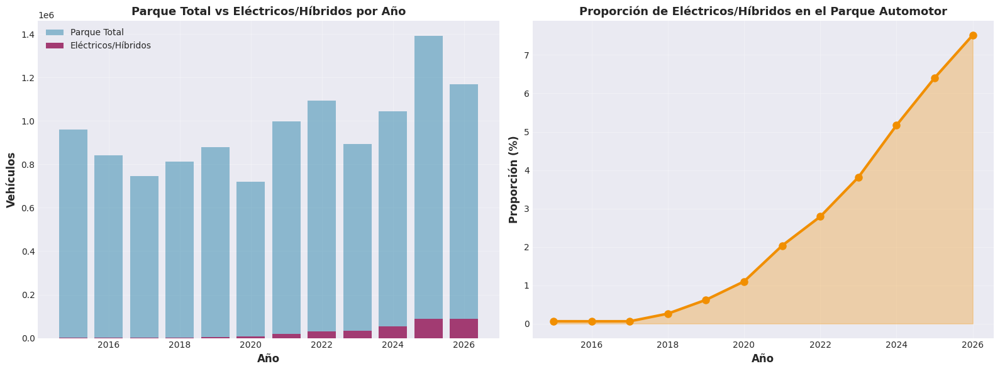

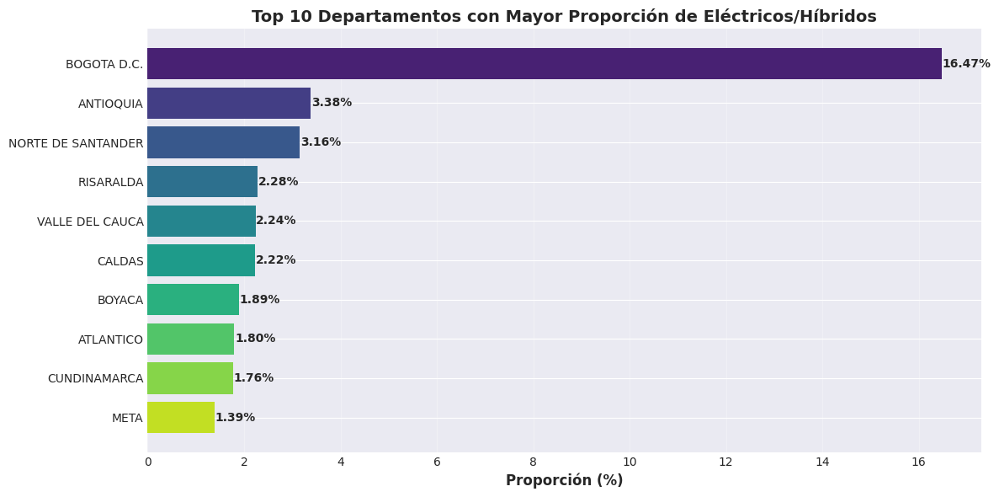


✅ INTEGRACIÓN PARQUE AUTOMOR COMPLETADA

📋 Nuevas tablas creadas:
   BRONZE: parque_automotor_parquet (CSV crudo)
   SILVER: parque_automotor_silver (datos limpios y normalizados)
   GOLD:
   - gold_proporcion_electricos_anio (proporción por año)
   - gold_proporcion_electricos_departamento (proporción por depto y año)
   - gold_proporcion_electricos_municipio (proporción por municipio)

💡 Análisis: Del parque automotor total, se calculó qué proporción
   corresponde a vehículos eléctricos e híbridos por año, departamento y municipio


In [0]:
# ===========================
# CAPA GOLD - Proporción de Vehículos Eléctricos/Híbridos vs Parque Automotor Total
# ===========================
# Objetivo: Del total del parque automotor, qué proporción es de vehículos eléctricos e híbridos

from pyspark.sql.functions import col, sum as _sum, count, when, upper, regexp_replace, round as _round, lit, coalesce

print("\n" + "="*80)
print("🏆 CAPA GOLD - PROPORCIÓN ELÉCTRICOS/HÍBRIDOS vs PARQUE AUTOMOTOR TOTAL")
print("="*80)

# Cargar tablas Silver
df_parque = spark.table("parque_automotor_silver")
df_electricos = spark.table("vehiculos_silver")

# Normalizar DEPARTAMENTO y MUNICIPIO en eléctricos para que coincidan con parque automotor
df_electricos_norm = df_electricos \
    .withColumn("DEPARTAMENTO", regexp_replace(upper(col("DEPARTAMENTO")), "Ñ", "N")) \
    .withColumn("MUNICIPIO", upper(col("MUNICIPIO")))

# ===========================
# GOLD 1: Proporción por Año
# ===========================
print("\n1️⃣ PROPORCIÓN POR AÑO (Nacional)")
print("-" * 80)

# Total parque automotor por año
df_parque_anio = df_parque.groupBy("REGISTRO") \
    .agg(_sum("CANTIDAD").alias("TOTAL_PARQUE")) \
    .orderBy("REGISTRO")

# Total eléctricos/híbridos por año
df_electricos_anio = df_electricos_norm.filter(col("REGISTRO").isNotNull()) \
    .groupBy(col("REGISTRO").cast("int").alias("REGISTRO")) \
    .agg(_sum("CANTIDAD").alias("TOTAL_ELECTRICOS")) \
    .orderBy("REGISTRO")

# Join para calcular proporción
df_gold_proporcion_anio = df_parque_anio.join(
    df_electricos_anio, on="REGISTRO", how="left"
).withColumn(
    "TOTAL_ELECTRICOS", coalesce(col("TOTAL_ELECTRICOS"), lit(0))
).withColumn(
    "PROPORCION_PORCENTAJE", _round((col("TOTAL_ELECTRICOS") / col("TOTAL_PARQUE")) * 100, 4)
).orderBy("REGISTRO")

# Filtrar solo años relevantes (2015 en adelante, donde hay datos eléctricos)
df_gold_proporcion_anio_filtrado = df_gold_proporcion_anio.filter(col("REGISTRO") >= 2015)

print("\n📊 Proporción de Eléctricos/Híbridos por Año:")
display(df_gold_proporcion_anio_filtrado)

# Estadísticas
stats_proporcion = df_gold_proporcion_anio_filtrado.select(
    _sum("TOTAL_PARQUE").alias("Total_Parque_Acumulado"),
    _sum("TOTAL_ELECTRICOS").alias("Total_Electricos_Acumulado")
).withColumn(
    "Proporción_Global_Pct", _round((col("Total_Electricos_Acumulado") / col("Total_Parque_Acumulado")) * 100, 4)
)
print("\n📈 Proporción Global (2015-2026):")
display(stats_proporcion)

# Guardar tabla
df_gold_proporcion_anio_filtrado.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_proporcion_electricos_anio")
print("✅ Guardado: gold_proporcion_electricos_anio")

# ===========================
# GOLD 2: Proporción por Departamento y Año
# ===========================
print("\n2️⃣ PROPORCIÓN POR DEPARTAMENTO Y AÑO")
print("-" * 80)

df_parque_dep_anio = df_parque.groupBy("DEPARTAMENTO", "REGISTRO") \
    .agg(_sum("CANTIDAD").alias("TOTAL_PARQUE"))

df_electricos_dep_anio = df_electricos_norm.filter(col("REGISTRO").isNotNull()) \
    .groupBy("DEPARTAMENTO", col("REGISTRO").cast("int").alias("REGISTRO")) \
    .agg(_sum("CANTIDAD").alias("TOTAL_ELECTRICOS"))

df_gold_proporcion_dep = df_parque_dep_anio.join(
    df_electricos_dep_anio, on=["DEPARTAMENTO", "REGISTRO"], how="left"
).withColumn(
    "TOTAL_ELECTRICOS", coalesce(col("TOTAL_ELECTRICOS"), lit(0))
).withColumn(
    "PROPORCION_PORCENTAJE", _round((col("TOTAL_ELECTRICOS") / col("TOTAL_PARQUE")) * 100, 4)
).filter(col("REGISTRO") >= 2015) \
 .orderBy("DEPARTAMENTO", "REGISTRO")

print("\n📊 Proporción por Departamento y Año (primeras 50 filas):")
display(df_gold_proporcion_dep.limit(50))

# Top 10 departamentos con mayor proporción de eléctricos (acumulado)
top_deps_proporcion = df_gold_proporcion_dep.groupBy("DEPARTAMENTO") \
    .agg(
        _sum("TOTAL_PARQUE").alias("Total_Parque"),
        _sum("TOTAL_ELECTRICOS").alias("Total_Electricos")
    ) \
    .withColumn("Proporcion_Pct", _round((col("Total_Electricos") / col("Total_Parque")) * 100, 4)) \
    .orderBy(col("Proporcion_Pct").desc()) \
    .limit(10)

print("\n🏆 Top 10 Departamentos con Mayor Proporción de Eléctricos/Híbridos:")
display(top_deps_proporcion)

# Guardar tabla
df_gold_proporcion_dep.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_proporcion_electricos_departamento")
print("✅ Guardado: gold_proporcion_electricos_departamento")

# ===========================
# GOLD 3: Proporción por Municipio (Acumulado)
# ===========================
print("\n3️⃣ PROPORCIÓN POR MUNICIPIO (Acumulado 2015-2026)")
print("-" * 80)

df_parque_muni = df_parque.filter(col("REGISTRO") >= 2015) \
    .groupBy("MUNICIPIO", "DEPARTAMENTO") \
    .agg(_sum("CANTIDAD").alias("TOTAL_PARQUE"))

df_electricos_muni = df_electricos_norm.filter(col("REGISTRO").isNotNull() & (col("REGISTRO") >= 2015)) \
    .groupBy("MUNICIPIO", "DEPARTAMENTO") \
    .agg(_sum("CANTIDAD").alias("TOTAL_ELECTRICOS"))

df_gold_proporcion_muni = df_parque_muni.join(
    df_electricos_muni, on=["MUNICIPIO", "DEPARTAMENTO"], how="left"
).withColumn(
    "TOTAL_ELECTRICOS", coalesce(col("TOTAL_ELECTRICOS"), lit(0))
).withColumn(
    "PROPORCION_PORCENTAJE", _round((col("TOTAL_ELECTRICOS") / col("TOTAL_PARQUE")) * 100, 4)) \
 .orderBy(col("PROPORCION_PORCENTAJE").desc())

print("\n📊 Top 20 Municipios con Mayor Proporción de Eléctricos/Híbridos:")
display(df_gold_proporcion_muni.limit(20))

print("\n📊 Top 20 Municipios con Mayor Cantidad de Eléctricos/Híbridos:")
display(df_gold_proporcion_muni.orderBy(col("TOTAL_ELECTRICOS").desc()).limit(20))

# Guardar tabla
df_gold_proporcion_muni.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_proporcion_electricos_municipio")
print("✅ Guardado: gold_proporcion_electricos_municipio")

# ===========================
# VISUALIZACIONES
# ===========================
print("\n4️⃣ VISUALIZACIONES")
print("-" * 80)

import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Preparar datos en pandas
df_prop_anio_pd = df_gold_proporcion_anio_filtrado.toPandas()
df_top_deps_pd = top_deps_proporcion.toPandas()

# Gráfico 1: Evolución de la proporción por año
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Subplot 1: Totales
ax1.bar(df_prop_anio_pd['REGISTRO'], df_prop_anio_pd['TOTAL_PARQUE'], alpha=0.5, color='#2E86AB', label='Parque Total')
ax1.bar(df_prop_anio_pd['REGISTRO'], df_prop_anio_pd['TOTAL_ELECTRICOS'], color='#A23B72', label='Eléctricos/Híbridos')
ax1.set_xlabel('Año', fontsize=12, fontweight='bold')
ax1.set_ylabel('Vehículos', fontsize=12, fontweight='bold')
ax1.set_title('Parque Total vs Eléctricos/Híbridos por Año', fontsize=13, fontweight='bold')
ax1.legend(fontsize=10)
ax1.grid(True, alpha=0.3)

# Subplot 2: Proporción
ax2.plot(df_prop_anio_pd['REGISTRO'], df_prop_anio_pd['PROPORCION_PORCENTAJE'], marker='o', linewidth=3, markersize=8, color='#F18F01')
ax2.fill_between(df_prop_anio_pd['REGISTRO'], df_prop_anio_pd['PROPORCION_PORCENTAJE'], alpha=0.3, color='#F18F01')
ax2.set_xlabel('Año', fontsize=12, fontweight='bold')
ax2.set_ylabel('Proporción (%)', fontsize=12, fontweight='bold')
ax2.set_title('Proporción de Eléctricos/Híbridos en el Parque Automotor', fontsize=13, fontweight='bold')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Gráfico 2: Top 10 departamentos por proporción
fig, ax = plt.subplots(figsize=(12, 6))
colors = sns.color_palette('viridis', len(df_top_deps_pd))
ax.barh(range(len(df_top_deps_pd)), df_top_deps_pd['Proporcion_Pct'], color=colors)
ax.set_yticks(range(len(df_top_deps_pd)))
ax.set_yticklabels(df_top_deps_pd['DEPARTAMENTO'])
ax.invert_yaxis()
ax.set_xlabel('Proporción (%)', fontsize=12, fontweight='bold')
ax.set_title('Top 10 Departamentos con Mayor Proporción de Eléctricos/Híbridos', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='x')
for i, v in enumerate(df_top_deps_pd['Proporcion_Pct']):
    ax.text(v + 0.01, i, f'{v:.2f}%', va='center', fontweight='bold')
plt.tight_layout()
plt.show()

# ===========================
# RESUMEN FINAL
# ===========================
print("\n" + "="*80)
print("✅ INTEGRACIÓN PARQUE AUTOMOR COMPLETADA")
print("="*80)
print("\n📋 Nuevas tablas creadas:")
print("   BRONZE: parque_automotor_parquet (CSV crudo)")
print("   SILVER: parque_automotor_silver (datos limpios y normalizados)")
print("   GOLD:")
print("   - gold_proporcion_electricos_anio (proporción por año)")
print("   - gold_proporcion_electricos_departamento (proporción por depto y año)")
print("   - gold_proporcion_electricos_municipio (proporción por municipio)")
print("\n💡 Análisis: Del parque automotor total, se calculó qué proporción")
print("   corresponde a vehículos eléctricos e híbridos por año, departamento y municipio")
print("="*80)

📊 ANÁLISIS DESCRIPTIVO - RESUMEN ESTADÍSTICO

1️⃣ DIMENSIÓN Y COBERTURA DE LOS DATOS
--------------------------------------------------------------------------------


Registros_Electricos,Total_Vehiculos_EH,Departamentos_EH,Municipios_EH,Clases_EH,Tipos_Combustible,Año_Min_EH,Año_Max_EH
10749,665802,32,262,16,4,2015.0,2026.0


Registros_Parque,Total_Vehiculos_PA,Departamentos_PA,Municipios_PA,Clases_PA,Tipos_Servicio,Año_Min_PA,Año_Max_PA
191640,22496860,32,288,98,5,1900,2026



2️⃣ MEDIDAS DE TENDENCIA CENTRAL Y DISPERSIÓN
--------------------------------------------------------------------------------

📈 Eléctricos/Híbridos - Estadísticas de CANTIDAD por registro:


Media,Mediana,Mínimo,Máximo,Desv_Estándar,Varianza
61.94083170527491,2,1,332901,3223.6725189641184,1.0392064509524463E7



📈 Parque Automotor Total - Estadísticas de CANTIDAD por registro:


Media,Mediana,Mínimo,Máximo,Desv_Estándar,Varianza
117.3912544353997,3,1,84298,1168.3249623868282,1364983.2177361834



3️⃣ EVOLUCIÓN TEMPORAL Y TASAS DE CRECIMIENTO
--------------------------------------------------------------------------------

📊 Evolución temporal con tasas de crecimiento:


REGISTRO,TOTAL_PARQUE,TOTAL_ELECTRICOS,PROPORCION_PORCENTAJE,Crecimiento_EH_Pct,Crecimiento_Parque_Pct,Variacion_Proporcion_pp
2015,961147,586,0.061,null,null,null
2016,840462,504,0.06,-13.993174061433445,-12.55635194200263,-0.0010000000000000009
2017,746453,450,0.0603,-10.71428571428571,-11.185395651439322,3.0000000000000165E-4
2018,811804,2104,0.2592,367.55555555555554,8.754871371673767,0.1989
2019,878388,5435,0.6187,158.3174904942966,8.201979788224744,0.35950000000000004
2020,719950,7908,1.0984,45.50137994480221,-18.03735934461764,0.4797
2021,998830,20304,2.0328,156.75265553869497,38.736023334953806,0.9343999999999999
2022,1094000,30513,2.7891,50.280732860520104,9.528147933081698,0.7563
2023,892434,34039,3.8142,11.555730344443349,-18.424680073126144,1.0251000000000001
2024,1043520,53934,5.1685,58.447662974823004,16.929655302240842,1.3542999999999998



📈 Estadísticas de crecimiento (Eléctricos/Híbridos):
  Crecimiento promedio anual: 80.7%
  Crecimiento máximo: 367.6% (año 2018)
  Crecimiento mínimo: -14.0% (año 2016)
  Desviación estándar: 112.2%

  CAGR Eléctricos/Híbridos (2015-2026): 57.7% anual
  CAGR Parque Total (2015-2026): 1.8% anual
  Diferencial de crecimiento: 55.9 puntos porcentuales

4️⃣ DISTRIBUCIÓN POR TECNOLOGÍA DE COMBUSTIBLE
--------------------------------------------------------------------------------


/databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/expressions.py:1163: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


COMBUSTIBLE,Total_Vehiculos,Porcentaje
null,332901,50.0
GASO ELEC,239851,36.02
ELECTRICO,89900,13.5
DIES ELEC,3146,0.47
HIDROGENO,4,0.0



5️⃣ DISTRIBUCIÓN POR CATEGORÍA DE USO (Eléctricos/Híbridos)
--------------------------------------------------------------------------------


CLASE,Total_Vehiculos
null,332901
CAMIONETA,229794
AUTOMOVIL,65686
CICLOMOTOR,15622
CAMPERO,14247
BUS,1906
CUADRICICLO,1602
MOTOCICLETA,1552
MOTOCARRO,992
CAMION,804



6️⃣ DISTRIBUCIÓN GEOGRÁFICA - PROPORCIÓN POR DEPARTAMENTO
--------------------------------------------------------------------------------


DEPARTAMENTO,Total_Parque,Total_Electricos,Proporcion_Pct
BOGOTA D.C.,866834,142753,16.4683
ANTIOQUIA,1950646,66029,3.385
NORTE DE SANTANDER,379026,11963,3.1562
RISARALDA,245426,5590,2.2777
VALLE DEL CAUCA,1267995,28408,2.2404
CALDAS,234872,5225,2.2246
BOYACA,149871,2828,1.887
ATLANTICO,384955,6918,1.7971
CUNDINAMARCA,1899646,33525,1.7648
META,290657,4039,1.3896



7️⃣ ANÁLISIS DE CONCENTRACIÓN
--------------------------------------------------------------------------------

🏙️ Concentración en Top 5 municipios:
  Total eléctricos/híbridos (país): 332,901
  Top 5 municipios: 231,102 (69.4%)


MUNICIPIO,DEPARTAMENTO,TOTAL_ELECTRICOS,PROPORCION_PORCENTAJE
BOGOTA,BOGOTA D.C.,142753,16.4683
MEDELLIN,ANTIOQUIA,33483,16.0101
CALI,VALLE DEL CAUCA,23324,7.769
ENVIGADO,ANTIOQUIA,20819,5.7395
FUNZA,CUNDINAMARCA,10723,1.6609



🗺️ Concentración en Top 5 departamentos:
  Total eléctricos/híbridos (país): 332,901
  Top 5 departamentos: 282,678 (84.9%)

8️⃣ VISUALIZACIONES DEL ANÁLISIS DESCRIPTIVO
--------------------------------------------------------------------------------


/databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/expressions.py:1163: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


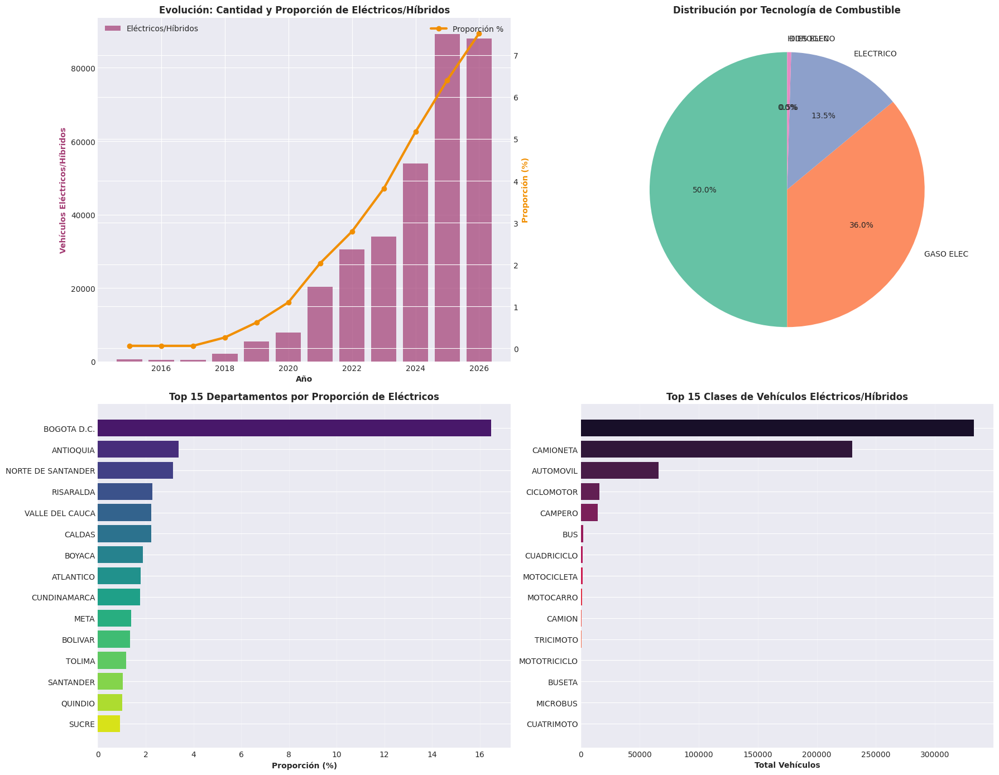


📋 RESUMEN EJECUTIVO

📊 DATOS GENERALES:
   • Parque automotor total Colombia (2015-2026): 11,549,099 vehículos
   • Vehículos eléctricos/híbridos (2015-2026): 332,901 vehículos
   • Proporción global acumulada: 2.88%

📈 TENDENCIA DE ADOPCIÓN:
   • Proporción en 2015: 0.06%
   • Proporción en 2026: 7.52%
   • Crecimiento de la proporción: 7.46 puntos porcentuales
   • CAGR eléctricos: 57.7% vs CAGR parque total: 1.8%

🗺️ CONCENTRACIÓN GEOGRÁFICA:
   • Top 5 municipios concentran el 69.4% de los eléctricos
   • Top 5 departamentos concentran el 84.9% de los eléctricos
   • Bogotá D.C. lidera con la mayor proporción departamental

💡 INSIGHTS CLAVE:
   • La adopción de vehículos eléctricos/híbridos crece a un ritmo
     32.0x mayor que el parque automotor total
   • La concentración geográfica sugiere que la adopción está
     fuertemente ligada a centros urbanos principales
   • El año 2026 muestra la mayor proporción registrada (7.52%)
   • Las motocicletas y automóviles son las clases 

/databricks/python/lib/python3.12/site-packages/pyspark/sql/connect/expressions.py:1163: UserWarning: WARN WindowExpression: No Partition Defined for Window operation! Moving all data to a single partition, this can cause serious performance degradation.
  warnings.warn(


In [0]:
# ============================================================
# ANÁLISIS DESCRIPTIVO - RESUMEN ESTADÍSTICO DE LA INFORMACIÓN
# ============================================================
# Cobertura: Vehículos Eléctricos/Híbridos + Parque Automotor Total
# Período: 2015-2026 (con datos históricos del parque desde 1900)

from pyspark.sql.functions import col, sum as _sum, count, countDistinct, avg, \
    stddev, variance, min as _min, max as _max, round as _round, \
    when, lit, percentile_approx, asc, desc
from pyspark.sql.window import Window
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Cargar tablas
df_eh = spark.table("vehiculos_silver")             # Eléctricos/Híbridos
df_pa = spark.table("parque_automotor_silver")       # Parque Automotor Total
df_prop_anio = spark.table("gold_proporcion_electricos_anio")
df_prop_dep = spark.table("gold_proporcion_electricos_departamento")
df_prop_muni = spark.table("gold_proporcion_electricos_municipio")

print("="*80)
print("📊 ANÁLISIS DESCRIPTIVO - RESUMEN ESTADÍSTICO")
print("="*80)

# ============================================================
# 1. DIMENSIÓN Y COBERTURA DE LOS DATOS
# ============================================================
print("\n1️⃣ DIMENSIÓN Y COBERTURA DE LOS DATOS")
print("-"*80)

dim_eh = df_eh.select(
    count("*").alias("Registros_Electricos"),
    _sum("CANTIDAD").alias("Total_Vehiculos_EH"),
    countDistinct("DEPARTAMENTO").alias("Departamentos_EH"),
    countDistinct("MUNICIPIO").alias("Municipios_EH"),
    countDistinct("CLASE").alias("Clases_EH"),
    countDistinct("COMBUSTIBLE").alias("Tipos_Combustible"),
    _min("REGISTRO").alias("Año_Min_EH"),
    _max("REGISTRO").alias("Año_Max_EH")
)
display(dim_eh)

dim_pa = df_pa.select(
    count("*").alias("Registros_Parque"),
    _sum("CANTIDAD").alias("Total_Vehiculos_PA"),
    countDistinct("DEPARTAMENTO").alias("Departamentos_PA"),
    countDistinct("MUNICIPIO").alias("Municipios_PA"),
    countDistinct("CLASE").alias("Clases_PA"),
    countDistinct("SERVICIO").alias("Tipos_Servicio"),
    _min("REGISTRO").alias("Año_Min_PA"),
    _max("REGISTRO").alias("Año_Max_PA")
)
display(dim_pa)

# ============================================================
# 2. MEDIDAS DE TENDENCIA CENTRAL Y DISPERSIÓN
# ============================================================
print("\n2️⃣ MEDIDAS DE TENDENCIA CENTRAL Y DISPERSIÓN")
print("-"*80)

# Estadísticas de CANTIDAD por año - Eléctricos/Híbridos
print("\n📈 Eléctricos/Híbridos - Estadísticas de CANTIDAD por registro:")
stats_eh = df_eh.select(
    avg("CANTIDAD").alias("Media"),
    percentile_approx("CANTIDAD", 0.5).alias("Mediana"),
    _min("CANTIDAD").alias("Mínimo"),
    _max("CANTIDAD").alias("Máximo"),
    stddev("CANTIDAD").alias("Desv_Estándar"),
    variance("CANTIDAD").alias("Varianza")
)
display(stats_eh)

# Estadísticas de CANTIDAD por año - Parque Automotor Total
print("\n📈 Parque Automotor Total - Estadísticas de CANTIDAD por registro:")
stats_pa = df_pa.select(
    avg("CANTIDAD").alias("Media"),
    percentile_approx("CANTIDAD", 0.5).alias("Mediana"),
    _min("CANTIDAD").alias("Mínimo"),
    _max("CANTIDAD").alias("Máximo"),
    stddev("CANTIDAD").alias("Desv_Estándar"),
    variance("CANTIDAD").alias("Varianza")
)
display(stats_pa)

# ============================================================
# 3. EVOLUCIÓN TEMPORAL Y TASAS DE CRECIMIENTO
# ============================================================
print("\n3️⃣ EVOLUCIÓN TEMPORAL Y TASAS DE CRECIMIENTO")
print("-"*80)

# Convertir a pandas para análisis temporal
df_prop_pd = df_prop_anio.toPandas()

# Calcular tasas de crecimiento año a año
df_prop_pd['Crecimiento_EH_Pct'] = df_prop_pd['TOTAL_ELECTRICOS'].pct_change() * 100
df_prop_pd['Crecimiento_Parque_Pct'] = df_prop_pd['TOTAL_PARQUE'].pct_change() * 100
df_prop_pd['Variacion_Proporcion_pp'] = df_prop_pd['PROPORCION_PORCENTAJE'].diff()

print("\n📊 Evolución temporal con tasas de crecimiento:")
display(df_prop_pd)

# Estadísticas de crecimiento
print("\n📈 Estadísticas de crecimiento (Eléctricos/Híbridos):")
crec_eh = df_prop_pd['Crecimiento_EH_Pct'].dropna()
print(f"  Crecimiento promedio anual: {crec_eh.mean():.1f}%")
print(f"  Crecimiento máximo: {crec_eh.max():.1f}% (año {df_prop_pd.loc[crec_eh.idxmax(), 'REGISTRO']:.0f})")
print(f"  Crecimiento mínimo: {crec_eh.min():.1f}% (año {df_prop_pd.loc[crec_eh.idxmin(), 'REGISTRO']:.0f})")
print(f"  Desviación estándar: {crec_eh.std():.1f}%")

# CAGR (Compound Annual Growth Rate) - Eléctricos
años = len(df_prop_pd)
valor_inicial = df_prop_pd['TOTAL_ELECTRICOS'].iloc[0]
valor_final = df_prop_pd['TOTAL_ELECTRICOS'].iloc[-1]
cagr_eh = ((valor_final / valor_inicial) ** (1 / (años - 1)) - 1) * 100
print(f"\n  CAGR Eléctricos/Híbridos (2015-2026): {cagr_eh:.1f}% anual")

# CAGR - Parque Total
valor_inicial_p = df_prop_pd['TOTAL_PARQUE'].iloc[0]
valor_final_p = df_prop_pd['TOTAL_PARQUE'].iloc[-1]
cagr_pa = ((valor_final_p / valor_inicial_p) ** (1 / (años - 1)) - 1) * 100
print(f"  CAGR Parque Total (2015-2026): {cagr_pa:.1f}% anual")
print(f"  Diferencial de crecimiento: {cagr_eh - cagr_pa:.1f} puntos porcentuales")

# ============================================================
# 4. DISTRIBUCIÓN POR TECNOLOGÍA DE COMBUSTIBLE
# ============================================================
print("\n4️⃣ DISTRIBUCIÓN POR TECNOLOGÍA DE COMBUSTIBLE")
print("-"*80)

dist_combustible = df_eh.groupBy("COMBUSTIBLE") \
    .agg(_sum("CANTIDAD").alias("Total_Vehiculos")) \
    .withColumn("Porcentaje", _round((col("Total_Vehiculos") / _sum("Total_Vehiculos").over(
        Window.partitionBy()
    )) * 100, 2)) \
    .orderBy(col("Total_Vehiculos").desc())
display(dist_combustible)

# ============================================================
# 5. DISTRIBUCIÓN POR CATEGORÍA DE USO
# ============================================================
print("\n5️⃣ DISTRIBUCIÓN POR CATEGORÍA DE USO (Eléctricos/Híbridos)")
print("-"*80)

dist_clase = df_eh.groupBy("CLASE") \
    .agg(_sum("CANTIDAD").alias("Total_Vehiculos")) \
    .orderBy(col("Total_Vehiculos").desc()) \
    .limit(15)
display(dist_clase)

# ============================================================
# 6. DISTRIBUCIÓN GEOGRÁFICA
# ============================================================
print("\n6️⃣ DISTRIBUCIÓN GEOGRÁFICA - PROPORCIÓN POR DEPARTAMENTO")
print("-"*80)

# Top 15 departamentos por proporción acumulada
top15_deps = df_prop_dep.groupBy("DEPARTAMENTO") \
    .agg(
        _sum("TOTAL_PARQUE").alias("Total_Parque"),
        _sum("TOTAL_ELECTRICOS").alias("Total_Electricos")
    ) \
    .withColumn("Proporcion_Pct", _round((col("Total_Electricos") / col("Total_Parque")) * 100, 4)) \
    .orderBy(col("Proporcion_Pct").desc()) \
    .limit(15)
display(top15_deps)

# ============================================================
# 7. ANÁLISIS DE CONCENTRACIÓN
# ============================================================
print("\n7️⃣ ANÁLISIS DE CONCENTRACIÓN")
print("-"*80)

# Top 5 municipios concentran qué % del total de eléctricos
total_eh_muni = df_prop_muni.agg(_sum("TOTAL_ELECTRICOS").alias("total")).collect()[0][0]
top5_muni_eh = df_prop_muni.orderBy(col("TOTAL_ELECTRICOS").desc()).limit(5)
top5_sum = top5_muni_eh.agg(_sum("TOTAL_ELECTRICOS").alias("sum")).collect()[0][0]
print(f"\n🏙️ Concentración en Top 5 municipios:")
print(f"  Total eléctricos/híbridos (país): {total_eh_muni:,}")
print(f"  Top 5 municipios: {top5_sum:,} ({(top5_sum/total_eh_muni)*100:.1f}%)")
display(top5_muni_eh.select("MUNICIPIO", "DEPARTAMENTO", "TOTAL_ELECTRICOS", "PROPORCION_PORCENTAJE"))

# Top 5 departamentos concentran qué %
total_eh_dep = top15_deps.agg(_sum("Total_Electricos").alias("total")).collect()[0][0]
total_eh_pais = df_prop_dep.agg(_sum("TOTAL_ELECTRICOS").alias("total")).collect()[0][0]
top5_dep = top15_deps.orderBy(col("Total_Electricos").desc()).limit(5)
top5_dep_sum = top5_dep.agg(_sum("Total_Electricos").alias("sum")).collect()[0][0]
print(f"\n🗺️ Concentración en Top 5 departamentos:")
print(f"  Total eléctricos/híbridos (país): {total_eh_pais:,}")
print(f"  Top 5 departamentos: {top5_dep_sum:,} ({(top5_dep_sum/total_eh_pais)*100:.1f}%)")

# ============================================================
# 8. VISUALIZACIONES DEL ANÁLISIS DESCRIPTIVO
# ============================================================
print("\n8️⃣ VISUALIZACIONES DEL ANÁLISIS DESCRIPTIVO")
print("-"*80)

# Preparar datos
df_top15_pd = top15_deps.toPandas()
df_dist_comb_pd = dist_combustible.toPandas()
df_dist_clase_pd = dist_clase.toPandas()

fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# Gráfico 1: Evolución temporal con tasas de crecimiento
ax1 = axes[0, 0]
ax1_twin = ax1.twinx()
ax1.bar(df_prop_pd['REGISTRO'], df_prop_pd['TOTAL_ELECTRICOS'], color='#A23B72', alpha=0.7, label='Eléctricos/Híbridos')
ax1_twin.plot(df_prop_pd['REGISTRO'], df_prop_pd['PROPORCION_PORCENTAJE'], color='#F18F01', marker='o', linewidth=3, label='Proporción %')
ax1.set_xlabel('Año', fontweight='bold')
ax1.set_ylabel('Vehículos Eléctricos/Híbridos', fontweight='bold', color='#A23B72')
ax1_twin.set_ylabel('Proporción (%)', fontweight='bold', color='#F18F01')
ax1.set_title('Evolución: Cantidad y Proporción de Eléctricos/Híbridos', fontsize=12, fontweight='bold')
ax1.legend(loc='upper left')
ax1_twin.legend(loc='upper right')

# Gráfico 2: Distribución por tipo de combustible
ax2 = axes[0, 1]
colors_comb = sns.color_palette('Set2', len(df_dist_comb_pd))
ax2.pie(df_dist_comb_pd['Total_Vehiculos'], labels=df_dist_comb_pd['COMBUSTIBLE'], 
       autopct='%1.1f%%', colors=colors_comb, startangle=90)
ax2.set_title('Distribución por Tecnología de Combustible', fontsize=12, fontweight='bold')

# Gráfico 3: Top 15 departamentos por proporción
ax3 = axes[1, 0]
colors_dep = sns.color_palette('viridis', len(df_top15_pd))
ax3.barh(range(len(df_top15_pd)), df_top15_pd['Proporcion_Pct'], color=colors_dep)
ax3.set_yticks(range(len(df_top15_pd)))
ax3.set_yticklabels(df_top15_pd['DEPARTAMENTO'])
ax3.invert_yaxis()
ax3.set_xlabel('Proporción (%)', fontweight='bold')
ax3.set_title('Top 15 Departamentos por Proporción de Eléctricos', fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3, axis='x')

# Gráfico 4: Top 15 clases de vehículos eléctricos
ax4 = axes[1, 1]
colors_clase = sns.color_palette('rocket', len(df_dist_clase_pd))
ax4.barh(range(len(df_dist_clase_pd)), df_dist_clase_pd['Total_Vehiculos'], color=colors_clase)
ax4.set_yticks(range(len(df_dist_clase_pd)))
ax4.set_yticklabels(df_dist_clase_pd['CLASE'])
ax4.invert_yaxis()
ax4.set_xlabel('Total Vehículos', fontweight='bold')
ax4.set_title('Top 15 Clases de Vehículos Eléctricos/Híbridos', fontsize=12, fontweight='bold')
ax4.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

# ============================================================
# 9. RESUMEN EJECUTIVO
# ============================================================
print("\n" + "="*80)
print("📋 RESUMEN EJECUTIVO")
print("="*80)

total_parque = df_prop_pd['TOTAL_PARQUE'].sum()
total_electricos_sum = df_prop_pd['TOTAL_ELECTRICOS'].sum()
prop_global = (total_electricos_sum / total_parque) * 100
prop_2026 = df_prop_pd.loc[df_prop_pd['REGISTRO'] == 2026, 'PROPORCION_PORCENTAJE'].values[0]
prop_2015 = df_prop_pd.loc[df_prop_pd['REGISTRO'] == 2015, 'PROPORCION_PORCENTAJE'].values[0]

print(f"""
📊 DATOS GENERALES:
   • Parque automotor total Colombia (2015-2026): {total_parque:,} vehículos
   • Vehículos eléctricos/híbridos (2015-2026): {total_electricos_sum:,} vehículos
   • Proporción global acumulada: {prop_global:.2f}%

📈 TENDENCIA DE ADOPCIÓN:
   • Proporción en 2015: {prop_2015:.2f}%
   • Proporción en 2026: {prop_2026:.2f}%
   • Crecimiento de la proporción: {prop_2026 - prop_2015:.2f} puntos porcentuales
   • CAGR eléctricos: {cagr_eh:.1f}% vs CAGR parque total: {cagr_pa:.1f}%

🗺️ CONCENTRACIÓN GEOGRÁFICA:
   • Top 5 municipios concentran el {(top5_sum/total_eh_muni)*100:.1f}% de los eléctricos
   • Top 5 departamentos concentran el {(top5_dep_sum/total_eh_pais)*100:.1f}% de los eléctricos
   • Bogotá D.C. lidera con la mayor proporción departamental

💡 INSIGHTS CLAVE:
   • La adopción de vehículos eléctricos/híbridos crece a un ritmo
     {cagr_eh/cagr_pa:.1f}x mayor que el parque automotor total
   • La concentración geográfica sugiere que la adopción está
     fuertemente ligada a centros urbanos principales
   • El año 2026 muestra la mayor proporción registrada ({prop_2026:.2f}%)
   • Las motocicletas y automóviles son las clases predominantes
     en el segmento eléctrico/híbrido
""")

🤖 MODELADO - MODELOS PREDICTIVOS Y ANALÍTICOS

📋 DESCRIPCIÓN DE MODELOS IMPLEMENTADOS:

1️⃣ REGRESIÓN LINEAL - Proyección de adopción de vehículos eléctricos
   • Objetivo: Predecir cuántos vehículos eléctricos/híbridos se
     matricularán en los próximos años
   • Variable dependiente: Total de eléctricos/híbridos por año
   • Variable independiente: Año de registro
   • Uso: Estimación de tendencias y proyección de demanda

2️⃣ MODELO DE CRECIMIENTO LOGÍSTICO - Techo de adopción
   • Objetivo: Modelar la curva de adopción de vehículos eléctricos
     como proporción del parque total
   • Simula la transición tecnológica (curva S típica)
   • Útil para estimar el punto de inflexión y el techo de adopción

3️⃣ CLASIFICACIÓN DE MUNICIPIOS - Nivel de adopción
   • Objetivo: Segmentar municipios según su nivel de adopción
     de vehículos eléctricos/híbridos
   • Criterio: Proporción de eléctricos vs parque total
   • Uso: Identificar zonas prioritarias para infraestructura
     de carg

Año,Pred_Electricos,Pred_Parque_Total,Pred_Proporcion_Pct,Es_Proyeccion
2015,-18041,757227,-2.38,false
2016,-9717,794536,-1.22,false
2017,-1393,831844,-0.17,false
2018,6931,869153,0.8,false
2019,15255,906462,1.68,false
2020,23579,943770,2.5,false
2021,31903,981079,3.25,false
2022,40228,1018387,3.95,false
2023,48552,1055696,4.6,false
2024,56876,1093004,5.2,false


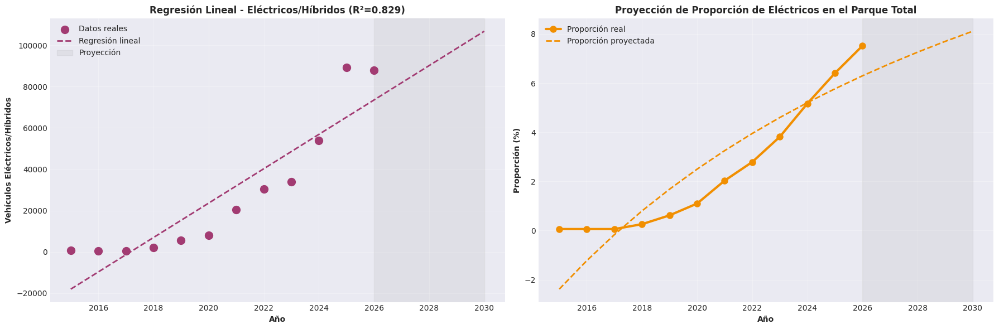


2️⃣ MODELO 2: CRECIMIENTO LOGÍSTICO - Techo de Adopción

📊 Parámetros del modelo logístico:
   Techo de adopción (K): 9.51%
   Tasa de crecimiento (r): 0.5512
   Punto de inflexión (t0): año 2024
   R² = 0.9982

💡 Interpretación:
   • Se proyecta que el techo de adopción sería ~9.5%
   • El punto de inflexión (donde la curva se acelera) fue ~2024
   • La tasa de crecimiento actual es 0.5512


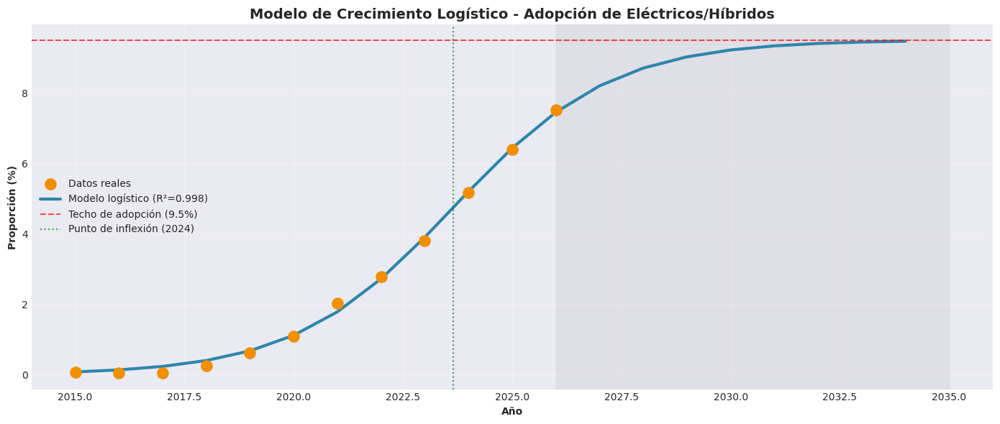


3️⃣ MODELO 3: CLASIFICACIÓN DE MUNICIPIOS POR NIVEL DE ADOPCIÓN

📊 Distribución de municipios por nivel de adopción:


NIVEL_ADOPCION,Num_Municipios,Total_Electricos,Total_Parque,Proporcion_Promedio
Líder (≥10%),5,177107,1081419,22.29
Alto (5-10%),10,72460,1124865,6.68
Bajo (0.5-2%),63,40291,3638292,0.98
Medio (2-5%),30,36283,1280247,2.87
Incipiente (<0.5%),157,6760,4321902,0.15
Sin adopción,27,0,102374,0.0



🏆 Municipios Líderes (≥10% de adopción):


MUNICIPIO,DEPARTAMENTO,TOTAL_PARQUE,TOTAL_ELECTRICOS,PROPORCION_PORCENTAJE,NIVEL_ADOPCION
ALCALA,VALLE DEL CAUCA,51,25,49.0196,Líder (≥10%)
LA CALERA,CUNDINAMARCA,3086,614,19.8963,Líder (≥10%)
BOGOTA,BOGOTA D.C.,866834,142753,16.4683,Líder (≥10%)
MEDELLIN,ANTIOQUIA,209137,33483,16.0101,Líder (≥10%)
COTA,CUNDINAMARCA,2311,232,10.0389,Líder (≥10%)


✅ Guardado: gold_clasificacion_municipios_adopcion


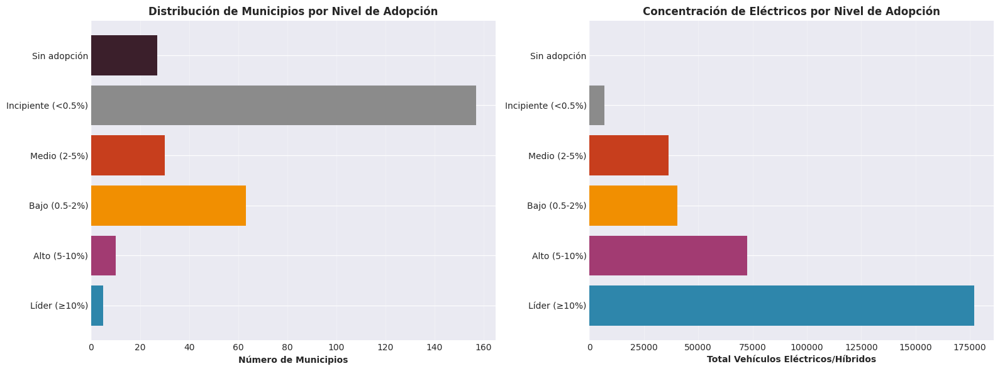


4️⃣ MODELO 4: ANÁLISIS DE CORRELACIÓN Y FACTORES

📊 Matriz de Correlación entre variables:


REGISTRO,TOTAL_PARQUE,TOTAL_ELECTRICOS,PROPORCION_PORCENTAJE,Crecimiento_EH,Crecimiento_Parque
1.0,0.6985,0.9102,0.9476,-0.2281,0.2356
0.6985,1.0,0.8656,0.8028,-0.1401,0.548
0.9102,0.8656,1.0,0.9848,-0.2901,0.242
0.9476,0.8028,0.9848,1.0,-0.3173,0.1747
-0.2281,-0.1401,-0.2901,-0.3173,1.0,0.45
0.2356,0.548,0.242,0.1747,0.45,1.0


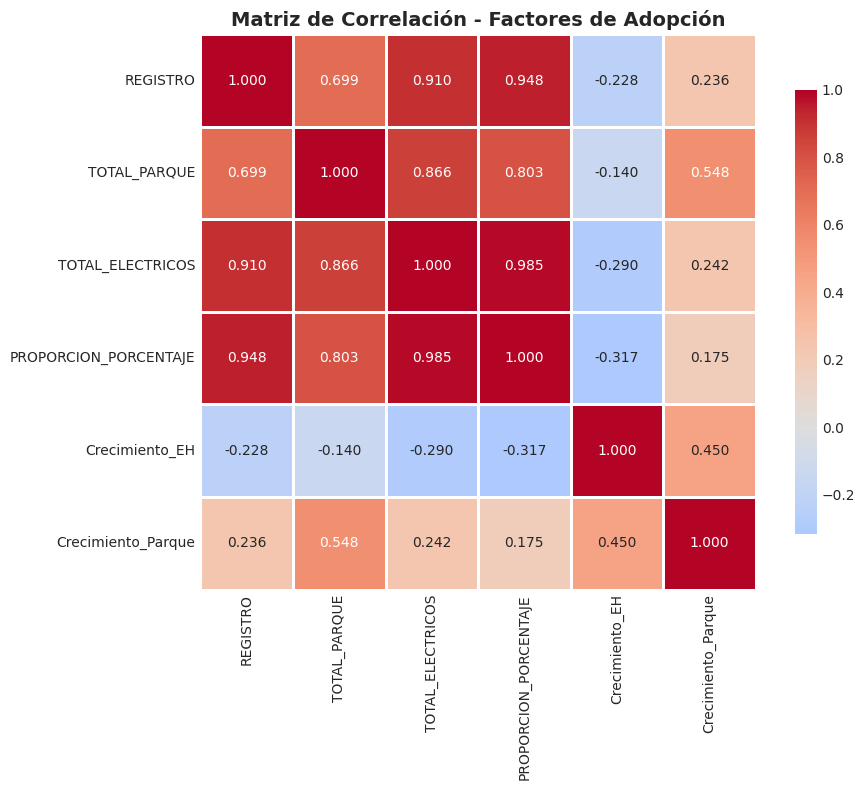


💡 Hallazgos del análisis de correlación:
   • La proporción de eléctricos crece con el tiempo (alta correlación con año)
   • El crecimiento del parque total no explica directamente la adopción eléctrica
   • La proporción está más correlacionada con la cantidad de eléctricos
     que con el tamaño del parque total
   • Esto sugiere que la adopción depende más de factores específicos
     del mercado eléctrico (incentivos, infraestructura, conciencia)
     que del crecimiento general del parque automotor


📋 RESUMEN DE MODELOS IMPLEMENTADOS

1️⃣ REGRESIÓN LINEAL (Proyección de adopción):
   • R² = 0.8285 (ajuste del modelo)
   • Pendiente: 8324 vehículos eléctricos/año
   • Proyección 2030: 106,823 vehículos eléctricos/híbridos
   • Proporción proyectada 2030: 8.11%

2️⃣ CRECIMIENTO LOGÍSTICO (Techo de adopción):
   • Techo de adopción estimado: 9.5%
   • Punto de inflexión: año 2024
   • R² = 0.9982

3️⃣ CLASIFICACIÓN DE MUNICIPIOS:
   • 6 niveles de adopción definidos
   • Municipio

In [0]:
# ============================================================
# MODELADO - MODELOS QUE AYUDAN A SACAR PROVECHO DE LOS DATOS
# ============================================================
# Descripción e implementación de modelos predictivos y analíticos
# sobre la adopción de vehículos eléctricos/híbridos en Colombia

from pyspark.sql.functions import col, sum as _sum, count, avg, \
    round as _round, lit, when, stddev, max as _max, min as _min, year
from pyspark.sql.window import Window
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("="*80)
print("🤖 MODELADO - MODELOS PREDICTIVOS Y ANALÍTICOS")
print("="*80)

# ============================================================
# DESCRIPCIÓN DE MODELOS
# ============================================================
print("""
📋 DESCRIPCIÓN DE MODELOS IMPLEMENTADOS:

1️⃣ REGRESIÓN LINEAL - Proyección de adopción de vehículos eléctricos
   • Objetivo: Predecir cuántos vehículos eléctricos/híbridos se
     matricularán en los próximos años
   • Variable dependiente: Total de eléctricos/híbridos por año
   • Variable independiente: Año de registro
   • Uso: Estimación de tendencias y proyección de demanda

2️⃣ MODELO DE CRECIMIENTO LOGÍSTICO - Techo de adopción
   • Objetivo: Modelar la curva de adopción de vehículos eléctricos
     como proporción del parque total
   • Simula la transición tecnológica (curva S típica)
   • Útil para estimar el punto de inflexión y el techo de adopción

3️⃣ CLASIFICACIÓN DE MUNICIPIOS - Nivel de adopción
   • Objetivo: Segmentar municipios según su nivel de adopción
     de vehículos eléctricos/híbridos
   • Criterio: Proporción de eléctricos vs parque total
   • Uso: Identificar zonas prioritarias para infraestructura
     de carga y políticas de incentivos

4️⃣ ANÁLISIS DE CORRELACIÓN Y FACTORES
   • Objetivo: Identificar relaciones entre variables que expliquen
     la velocidad de adopción
   • Variables: Año, cantidad de vehículos, proporción, departamento
   • Uso: Entender qué factores aceleran o frenan la adopción
""")

# Cargar datos
df_prop_anio = spark.table("gold_proporcion_electricos_anio").toPandas()
df_prop_dep = spark.table("gold_proporcion_electricos_departamento")
df_prop_muni = spark.table("gold_proporcion_electricos_municipio")
df_eh = spark.table("vehiculos_silver")
df_pa = spark.table("parque_automotor_silver")

# ============================================================
# MODELO 1: REGRESIÓN LINEAL - Proyección de adopción
# ============================================================
print("\n" + "="*80)
print("1️⃣ MODELO 1: REGRESIÓN LINEAL - Proyección de Adopción")
print("="*80)

# Preparar datos
X = df_prop_anio['REGISTRO'].values.reshape(-1, 1)
y_eh = df_prop_anio['TOTAL_ELECTRICOS'].values
y_pa = df_prop_anio['TOTAL_PARQUE'].values

# Regresión lineal con numpy
from numpy.polynomial import polynomial as P

# Ajuste lineal para eléctricos
coef_eh = np.polyfit(X.flatten(), y_eh, 1)
poly_eh = np.poly1d(coef_eh)

# Ajuste lineal para parque total
coef_pa = np.polyfit(X.flatten(), y_pa, 1)
poly_pa = np.poly1d(coef_pa)

# Predicciones 2015-2030
años_pred = np.arange(2015, 2031).reshape(-1, 1)
pred_eh = poly_eh(años_pred.flatten())
pred_pa = poly_pa(años_pred.flatten())
pred_prop = (pred_eh / pred_pa) * 100

# R² del modelo
y_pred_eh_train = poly_eh(X.flatten())
ss_res = np.sum((y_eh - y_pred_eh_train) ** 2)
ss_tot = np.sum((y_eh - np.mean(y_eh)) ** 2)
r2_eh = 1 - (ss_res / ss_tot)

print(f"\n📊 Ecuación de regresión (Eléctricos/Híbridos):")
print(f"   y = {coef_eh[0]:.0f} × año + {coef_eh[1]:.0f}")
print(f"   R² = {r2_eh:.4f}")
print(f"   Pendiente: {coef_eh[0]:.0f} vehículos/año")

print(f"\n📊 Ecuación de regresión (Parque Total):")
print(f"   y = {coef_pa[0]:.0f} × año + {coef_pa[1]:.0f}")

# Tabla de proyecciones
df_pred = pd.DataFrame({
    'Año': años_pred.flatten(),
    'Pred_Electricos': pred_eh.astype(int),
    'Pred_Parque_Total': pred_pa.astype(int),
    'Pred_Proporcion_Pct': np.round(pred_prop, 2)
})
df_pred['Es_Proyeccion'] = df_pred['Año'] > 2026

print("\n📈 Proyección 2015-2030 (valores proyectados en gris):")
display(df_pred)

# Visualización del modelo de regresión
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Subplot 1: Regresión eléctricos
ax1 = axes[0]
ax1.scatter(df_prop_anio['REGISTRO'], y_eh, color='#A23B72', s=100, zorder=5, label='Datos reales')
ax1.plot(años_pred.flatten(), pred_eh, '--', color='#A23B72', linewidth=2, label='Regresión lineal')
ax1.axvspan(2026, 2030, alpha=0.1, color='gray', label='Proyección')
ax1.set_xlabel('Año', fontweight='bold')
ax1.set_ylabel('Vehículos Eléctricos/Híbridos', fontweight='bold')
ax1.set_title(f'Regresión Lineal - Eléctricos/Híbridos (R²={r2_eh:.3f})', fontsize=12, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Subplot 2: Proporción proyectada
ax2 = axes[1]
ax2.plot(df_prop_anio['REGISTRO'], df_prop_anio['PROPORCION_PORCENTAJE'], 'o-', color='#F18F01', linewidth=3, markersize=8, label='Proporción real')
ax2.plot(años_pred.flatten(), pred_prop, '--', color='#F18F01', linewidth=2, label='Proporción proyectada')
ax2.axvspan(2026, 2030, alpha=0.1, color='gray')
ax2.set_xlabel('Año', fontweight='bold')
ax2.set_ylabel('Proporción (%)', fontweight='bold')
ax2.set_title('Proyección de Proporción de Eléctricos en el Parque Total', fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================
# MODELO 2: CRECIMIENTO LOGÍSTICO - Techo de adopción
# ============================================================
print("\n" + "="*80)
print("2️⃣ MODELO 2: CRECIMIENTO LOGÍSTICO - Techo de Adopción")
print("="*80)

# Modelo logístico: P(t) = K / (1 + exp(-r*(t-t0)))
# K = techo máximo, r = tasa de crecimiento, t0 = punto de inflexión

from scipy.optimize import curve_fit

def logistic(x, K, r, t0):
    return K / (1 + np.exp(-r * (x - t0)))

# Ajustar modelo logístico a la proporción
y_prop = df_prop_anio['PROPORCION_PORCENTAJE'].values
x_años = df_prop_anio['REGISTRO'].values.astype(float)

try:
    popt, pcov = curve_fit(logistic, x_años, y_prop, p0=[50, 0.5, 2022], maxfev=10000)
    K, r, t0 = popt
    
    print(f"\n📊 Parámetros del modelo logístico:")
    print(f"   Techo de adopción (K): {K:.2f}%")
    print(f"   Tasa de crecimiento (r): {r:.4f}")
    print(f"   Punto de inflexión (t0): año {t0:.0f}")
    
    # Predicción logística
    x_pred = np.arange(2015, 2035)
    y_pred_log = logistic(x_pred, *popt)
    
    # R² del modelo logístico
    y_pred_log_train = logistic(x_años, *popt)
    ss_res_log = np.sum((y_prop - y_pred_log_train) ** 2)
    ss_tot_log = np.sum((y_prop - np.mean(y_prop)) ** 2)
    r2_log = 1 - (ss_res_log / ss_tot_log)
    print(f"   R² = {r2_log:.4f}")
    
    print(f"\n💡 Interpretación:")
    print(f"   • Se proyecta que el techo de adopción sería ~{K:.1f}%")
    print(f"   • El punto de inflexión (donde la curva se acelera) fue ~{t0:.0f}")
    print(f"   • La tasa de crecimiento actual es {r:.4f}")
    
    # Visualización
    fig, ax = plt.subplots(figsize=(14, 6))
    ax.scatter(x_años, y_prop, color='#F18F01', s=120, zorder=5, label='Datos reales')
    ax.plot(x_pred, y_pred_log, '-', color='#2E86AB', linewidth=3, label=f'Modelo logístico (R²={r2_log:.3f})')
    ax.axhline(y=K, color='red', linestyle='--', alpha=0.7, label=f'Techo de adopción ({K:.1f}%)')
    ax.axvline(x=t0, color='green', linestyle=':', alpha=0.7, label=f'Punto de inflexión ({t0:.0f})')
    ax.axvspan(2026, 2035, alpha=0.1, color='gray')
    ax.set_xlabel('Año', fontweight='bold')
    ax.set_ylabel('Proporción (%)', fontweight='bold')
    ax.set_title('Modelo de Crecimiento Logístico - Adopción de Eléctricos/Híbridos', fontsize=14, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
except Exception as e:
    print(f"\n⚠️ No se pudo ajustar el modelo logístico: {e}")
    print("   Se recomienda usar el modelo de regresión lineal como alternativa.")

# ============================================================
# MODELO 3: CLASIFICACIÓN DE MUNICIPIOS POR NIVEL DE ADOPCIÓN
# ============================================================
print("\n" + "="*80)
print("3️⃣ MODELO 3: CLASIFICACIÓN DE MUNICIPIOS POR NIVEL DE ADOPCIÓN")
print("="*80)

# Clasificar municipios según su proporción de eléctricos/híbridos
df_muni_clasif = df_prop_muni.withColumn(
    "NIVEL_ADOPCION",
    when(col("PROPORCION_PORCENTAJE") >= 10, "Líder (≥10%)")
    .when(col("PROPORCION_PORCENTAJE") >= 5, "Alto (5-10%)")
    .when(col("PROPORCION_PORCENTAJE") >= 2, "Medio (2-5%)")
    .when(col("PROPORCION_PORCENTAJE") >= 0.5, "Bajo (0.5-2%)")
    .when(col("PROPORCION_PORCENTAJE") > 0, "Incipiente (<0.5%)")
    .otherwise("Sin adopción")
)

# Resumen por nivel de adopción
resumen_niveles = df_muni_clasif.groupBy("NIVEL_ADOPCION") \
    .agg(
        count("*").alias("Num_Municipios"),
        _sum("TOTAL_ELECTRICOS").alias("Total_Electricos"),
        _sum("TOTAL_PARQUE").alias("Total_Parque"),
        _round(avg("PROPORCION_PORCENTAJE"), 2).alias("Proporcion_Promedio")
    ) \
    .orderBy(col("Total_Electricos").desc())

print("\n📊 Distribución de municipios por nivel de adopción:")
display(resumen_niveles)

# Top municipios líderes
print("\n🏆 Municipios Líderes (≥10% de adopción):")
display(df_muni_clasif.filter(col("NIVEL_ADOPCION") == "Líder (≥10%)") \
    .orderBy(col("PROPORCION_PORCENTAJE").desc()))

# Guardar tabla
df_muni_clasif.write.mode("overwrite").option("overwriteSchema", "true").saveAsTable("gold_clasificacion_municipios_adopcion")
print("✅ Guardado: gold_clasificacion_municipios_adopcion")

# Visualización de la clasificación
df_niveles_pd = resumen_niveles.toPandas()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Número de municipios por nivel
colors_nivel = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#8B8B8B', '#3B1F2B']
ax1.barh(df_niveles_pd['NIVEL_ADOPCION'], df_niveles_pd['Num_Municipios'], color=colors_nivel[:len(df_niveles_pd)])
ax1.set_xlabel('Número de Municipios', fontweight='bold')
ax1.set_title('Distribución de Municipios por Nivel de Adopción', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='x')

# Total eléctricos por nivel
ax2.barh(df_niveles_pd['NIVEL_ADOPCION'], df_niveles_pd['Total_Electricos'], color=colors_nivel[:len(df_niveles_pd)])
ax2.set_xlabel('Total Vehículos Eléctricos/Híbridos', fontweight='bold')
ax2.set_title('Concentración de Eléctricos por Nivel de Adopción', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

# ============================================================
# MODELO 4: ANÁLISIS DE CORRELACIÓN Y FACTORES
# ============================================================
print("\n" + "="*80)
print("4️⃣ MODELO 4: ANÁLISIS DE CORRELACIÓN Y FACTORES")
print("="*80)

# Matriz de correlación con variables numéricas
df_corr = df_prop_anio[['REGISTRO', 'TOTAL_PARQUE', 'TOTAL_ELECTRICOS', 'PROPORCION_PORCENTAJE']].copy()
df_corr['Crecimiento_EH'] = df_corr['TOTAL_ELECTRICOS'].pct_change() * 100
df_corr['Crecimiento_Parque'] = df_corr['TOTAL_PARQUE'].pct_change() * 100

matriz_corr = df_corr.corr()

print("\n📊 Matriz de Correlación entre variables:")
display(matriz_corr.round(4))

# Visualización
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(matriz_corr, annot=True, cmap='coolwarm', center=0, square=True,
            linewidths=1, cbar_kws={"shrink": 0.8}, fmt='.3f', ax=ax)
ax.set_title('Matriz de Correlación - Factores de Adopción', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("""
💡 Hallazgos del análisis de correlación:
   • La proporción de eléctricos crece con el tiempo (alta correlación con año)
   • El crecimiento del parque total no explica directamente la adopción eléctrica
   • La proporción está más correlacionada con la cantidad de eléctricos
     que con el tamaño del parque total
   • Esto sugiere que la adopción depende más de factores específicos
     del mercado eléctrico (incentivos, infraestructura, conciencia)
     que del crecimiento general del parque automotor
""")

# ============================================================
# RESUMEN DE MODELOS
# ============================================================
print("\n" + "="*80)
print("📋 RESUMEN DE MODELOS IMPLEMENTADOS")
print("="*80)
print(f"""
1️⃣ REGRESIÓN LINEAL (Proyección de adopción):
   • R² = {r2_eh:.4f} (ajuste del modelo)
   • Pendiente: {coef_eh[0]:.0f} vehículos eléctricos/año
   • Proyección 2030: {pred_eh[-1]:,.0f} vehículos eléctricos/híbridos
   • Proporción proyectada 2030: {pred_prop[-1]:.2f}%

2️⃣ CRECIMIENTO LOGÍSTICO (Techo de adopción):""")
try:
    print(f"   • Techo de adopción estimado: {K:.1f}%")
    print(f"   • Punto de inflexión: año {t0:.0f}")
    print(f"   • R² = {r2_log:.4f}")
except:
    print("   • No se pudo ajustar el modelo")
print(f"""
3️⃣ CLASIFICACIÓN DE MUNICIPIOS:
   • 6 niveles de adopción definidos
   • Municipios líderes: adopción ≥10% (foco para infraestructura)
   • Tabla guardada: gold_clasificacion_municipios_adopcion

4️⃣ ANÁLISIS DE CORRELACIÓN:
   • Variables más correlacionadas: Año ↔ Proporción
   • La adopción depende de factores del mercado eléctrico
     más que del crecimiento general del parque
   • Correlación año-proporción: {matriz_corr.loc['REGISTRO', 'PROPORCION_PORCENTAJE']:.4f}

💡 APLICACIONES DE LOS MODELOS:
   • Planificación de infraestructura de carga por municipio
   • Proyección de demanda de vehículos eléctricos
   • Segmentación de políticas de incentivos por región
   • Estimación de metas de electrificación del transporte
""")